<a href="https://colab.research.google.com/github/mustafasergen/CS210-Introduction-to-Data-Science/blob/main/44_EDA_CS210.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Group ID and Project Members

**Group ID: 44 
  Irmak Çoban 26839
  Arda Göktaş 26708
  Ömer Faruk Altıntel 26327
  Mustafa Sergen Haysal 25431
  **

# Introduction: SPOTIFY SONG & GENRE ANALYSIS, POPULARITY PREDICTION and BUILDING A SIMPLE RECOMMENDATION SYSTEM

As the dataset provides many songs with pre-calculated features along with the genre information, there is a great potential to analyze how these features change with different genres. As the dataset spans over a long time, how the features of genres change over time can be analyzed at both Exploratory Data Analysis and Statistical Analysis & Hypothesis Testing sections. 



# Utilized Datasets

Link part of the data sets used: https: //www.kaggle.com/yamaerenay/spotify-dataset-19212020-160k-tracks

There were five issues observed. Firstly, the data was visualized and analyzed in detail .In the second part, the change of properties in the data over the years has been examined. Then, the most famous artists and songs in the data were examined. Afterwards, it was examined in more detail how songs of different genres have changed their characteristics over time. In the last part, the different characteristics of the subgenres of these different genres were examined, and their changes over the years were prepared with graphics. Technically, line plot and histogram were used in the graphics because they are more suitable for the project.


# MACHINE LEARNING  

## Preperation and Modeling Our Data 

Used Libraries Section

In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.ensemble import RandomForestRegressor
from sklearn.tree import DecisionTreeRegressor
from yellowbrick.features import JointPlotVisualizer
from sklearn.preprocessing import StandardScaler
from yellowbrick.target import FeatureCorrelation
from sklearn.model_selection import train_test_split 
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import LogisticRegression

Used Dataframe Section

In [ ]:
df.head(5)

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.991000,['Mamie Smith'],0.598,168333,0.224,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.6340,1920
1,0.643000,"[""Screamin' Jay Hawkins""]",0.852,150200,0.517,0,0hbkKFIJm7Z05H8Zl9w30f,0.026400,5,0.0809,-7.261,0,I Put A Spell On You,7,1920-01-05,0.0534,86.889,0.9500,1920
2,0.993000,['Mamie Smith'],0.647,163827,0.186,0,11m7laMUgmOKqI3oYzuhne,0.000018,0,0.5190,-12.098,1,Golfing Papa,4,1920,0.1740,97.600,0.6890,1920
3,0.000173,['Oscar Velazquez'],0.730,422087,0.798,0,19Lc5SfJJ5O1oaxY0fpwfh,0.801000,2,0.1280,-7.311,1,True House Music - Xavier Santos & Carlos Gomi...,17,1920-01-01,0.0425,127.997,0.0422,1920
4,0.295000,['Mixe'],0.704,165224,0.707,1,2hJjbsLCytGsnAHfdsLejp,0.000246,10,0.4020,-6.036,0,Xuniverxe,2,1920-10-01,0.0768,122.076,0.2990,1920


The Preparation of the Data and How the Features Relate to the Popularity Index for the Song.

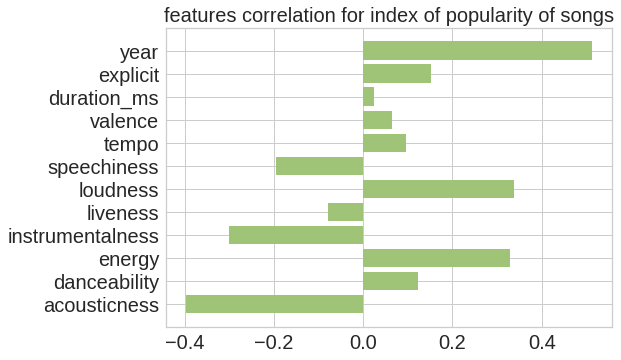

In [ ]:
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness',
       'liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','year']

X, y = df[feature_names], df['popularity']

features = np.array(feature_names)

visualizer = FeatureCorrelation(labels=features)

plt.rcParams['figure.figsize']=(20,20)
plt.title("features correlation for index of popularity of songs",fontsize=20)
plt.yticks(fontsize=20)
plt.xticks(fontsize=20)

visualizer.fit(X, y)        # Fit the data to the visualizer
visualizer.draw()

## Prediction of Song Popularity with Various Machine Learning Models


Partition Proportions

We used 80-10-10 data proportion.
80 for train set and 10-10 for valid and test set.

**Train Dataset:** A sample of the actual data to be used for training your model. Your model will be learning from this set.


**Validation Dataset:** A sample from the actual data to be utilized for hyperparameter fine-tunning.

**Test Dataset:** The sample to evaluate your model's performance.

---

In [ ]:
# 80% for training and 20% for testing-validation
train_X, X_remaining, train_y, y_remaining = train_test_split(X, y, test_size=0.20, random_state=42)
# 10% validation, 10% test
test_X, X_val, test_y, y_val = train_test_split(X_remaining, y_remaining, test_size=0.50, random_state=42)

Evaluation Metrics

*MSE (mean squared error):*  $\frac{1}{N}\sum_i \, (y_{true_i} - y_{pred_i})^2 \,$


*RMSE (root mean squared error):*  $\sqrt{\frac{1}{N}\sum_i \, (y_{true_i} - y_{pred_i})^2}$


*MAE (mean absolute error):* $\sum_i \, |y_{true_i} - y_{pred_i}| \,$



Since we are measuring the errors, we want these metrics to be as minimum as possible for a good performing model.

---

**Linear Regression**

A statistical model that that examines the linear relationship between two (simple linear regression) or more (multiple linear regression) variables.

In [ ]:
model_linear = LinearRegression()  
model_linear.fit(train_X, train_y)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [ ]:
y_pred = model_linear.predict(test_X)

mse = mean_squared_error(test_y, y_pred)
mae = mean_absolute_error(test_y, y_pred)
rmse = np.sqrt(mse)


print("mse: {}".format(mse)) # MSE (mean squared error)
print("mae: {}".format(mae)) # MAE (mean absolute error)
print("rmse: {}".format(rmse)) # RMSE (root mean squared error)

mse: 303.2875255200094
mae: 13.45325236793019
rmse: 17.415152181936552


**Logistic Regression**

Let us try to understand logistic regression by considering a logistic model with given parameters, then seeing how the coefficients can be estimated from data. Consider a model with two predictors, 
x
1
x_{1} and 
x
2
x_{2}, and one binary (Bernoulli) response variable 
Y
Y, which we denote 
p
=
P
(
Y
=
1
)
{\displaystyle p=P(Y=1)}. We assume a linear relationship between the predictor variables and the log-odds (also called logit) of the event that 
Y
=
1
Y=1. This linear relationship can be written in the following mathematical form (where ℓ is the log-odds, 
b
b is the base of the logarithm, and 
β
i
\beta _{i} are parameters of the model):

In [ ]:
from sklearn.linear_model import LogisticRegression
LR_Model = LogisticRegression()
LR_Model.fit(train_X , train_y)
LR_Predict = LR_Model.predict(test_X) #1 minute 29 second / run time without hyper-parameter

In [ ]:
mse = mean_squared_error(test_y, LR_Predict)
mae = mean_absolute_error(test_y, LR_Predict)
rmse = np.sqrt(mse)
print("mse: {}".format(mse)) # MSE (mean squared error)
print("mae: {}".format(mae)) # MAE (mean absolute error)
print("rmse: {}".format(rmse)) # RMSE (root mean squared error)

mse: 1128.5113251906646
mae: 25.503813292046562
rmse: 33.593322628026314


**Random Forest Regressor**

Random Forest is a supervised machine learning algorithm which can be used for both classification and regression problems. We run many decision trees independently and aggregate the outputs with a voting based approach.

In [ ]:
model_randomforest = RandomForestRegressor()
model_randomforest.fit(train_X, train_y) # 3 minute  21 second / run time without hyper-parameter

RandomForestRegressor(bootstrap=True, ccp_alpha=0.0, criterion='mse',
                      max_depth=None, max_features='auto', max_leaf_nodes=None,
                      max_samples=None, min_impurity_decrease=0.0,
                      min_impurity_split=None, min_samples_leaf=1,
                      min_samples_split=2, min_weight_fraction_leaf=0.0,
                      n_estimators=100, n_jobs=None, oob_score=False,
                      random_state=None, verbose=0, warm_start=False)

In [ ]:
preds = model_randomforest.predict(test_X)
mse = mean_squared_error(test_y, preds)
mae = mean_absolute_error(test_y, preds)
rmse = np.sqrt(mse)
print("mse: {}".format(mse)) # MSE (mean squared error)
print("mae: {}".format(mae)) # MAE (mean absolute error)
print("rmse: {}".format(rmse)) # RMSE (root mean squared error)

mse: 148.09052539110868
mae: 8.136230902541831
rmse: 12.169245062497044


**Decision Tree Regressor **

Decision trees are *supervised* machine learning algorithms which can be used for both *classification* and *regression* problems. The model we create is based on a *tree*, in the sense that we divide the data into subsets, i.e. *branches*, over and over again to generate a set of rules.

In [ ]:
model_Decision = DecisionTreeRegressor()
model_Decision.fit(train_X, train_y) # 3 second / run time without hyper-parameter

DecisionTreeRegressor(ccp_alpha=0.0, criterion='mse', max_depth=None,
                      max_features=None, max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, presort='deprecated',
                      random_state=None, splitter='best')

In [ ]:
pred_dec = model_Decision.predict(test_X)
mse = mean_squared_error(test_y, pred_dec)
mae = mean_absolute_error(test_y, pred_dec)
rmse = np.sqrt(mse)
print("mse: {}".format(mse)) # MSE (mean squared error)
print("mae: {}".format(mae)) # MAE (mean absolute error)
print("rmse: {}".format(rmse))# RMSE (root mean squared error)

mse: 288.41948104013454
mae: 10.295404025096095
rmse: 16.982917330074198


**Kneighbors Regressor**

kNN is a simple, yet a powerful machine learning algorithm. The main idea behind kNN is to check the surroundings of the given instance. It's a supervised algorithm and can be used in both classification and regression. It simply calculates the distance of a new data point to all other training data points. It then selects the K-nearest data points, where K can be any integer. Finally, it assigns the data point to the class to which the majority of the K data points belong.

In [ ]:
from sklearn.neighbors import KNeighborsRegressor
Model_KNN = KNeighborsRegressor()
Model_KNN.fit(train_X,train_y)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                    weights='uniform')

In [ ]:
pred_dec = Model_KNN.predict(test_X)
mse = mean_squared_error(test_y, pred_dec)
mae = mean_absolute_error(test_y, pred_dec)
rmse = np.sqrt(mse)
print("mse: {}".format(mse)) # MSE (mean squared error)
print("mae: {}".format(mae)) # MAE (mean absolute error)
print("rmse: {}".format(rmse))# RMSE (root mean squared error)

mse: 338.25690693273697
mae: 13.851700212168128
rmse: 18.39176193116736


**In Summary;**

1.   Linear Regressor (mae= 13.45)

2.   Logistic Regressor (mae = 25.51 )

3.   Decision Tree Regressor (mae = 10.29)

4.   Random Forest Regressor (mae = 8.13 )

5.   Kneighbors Regressor (mae = 13.85)




### Conclusion

we want to value of mean absolute error to minimum value for correctness of our model we test this mae with test data set and we examine minimum mae without hyper-parameter is 8.13 in random forest regressor.

## Efforts on hyper-parameter tuning to increase the performance of models

We can see parameters of models with get_params function

**Logistic Regressor Hyper-paramater**

In [ ]:
LR_Model.get_params()

{'C': 1.0,
 'class_weight': None,
 'dual': False,
 'fit_intercept': True,
 'intercept_scaling': 1,
 'l1_ratio': None,
 'max_iter': 100,
 'multi_class': 'auto',
 'n_jobs': None,
 'penalty': 'l2',
 'random_state': None,
 'solver': 'lbfgs',
 'tol': 0.0001,
 'verbose': 0,
 'warm_start': False}

In [ ]:
LR_Model = LogisticRegression(max_iter=5,intercept_scaling=1,tol=0.0001,random_state=0,n_jobs=5)
LR_Model.fit(train_X , train_y)
LR_Predict = LR_Model.predict(test_X) #9second run time with hyper-parameters

In [ ]:
mae = mean_absolute_error(test_y, LR_Predict)
print("mae: {}".format(mae)) # MAE (mean absolute error)

mae: 25.503813292046562


As easily can see that we found mae 25.50 with hyperparameter in logistic regression. it is the same result without hyper-parameter but usage of ram is minumum comparison to without hyper-parameter

**Decision Tree Regressor **

In [ ]:
model_Decision.get_params()

{'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': None,
 'max_leaf_nodes': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'presort': 'deprecated',
 'random_state': None,
 'splitter': 'best'}

In [ ]:
model_Decision.get_depth()

53

In [ ]:
dec_tree2 = DecisionTreeRegressor(max_depth=6, max_features=None, 
                                  min_samples_leaf=1, min_samples_split=2, random_state=1200)
dec_tree2.fit(train_X, train_y)
val_preds2 = dec_tree2.predict(test_X)
val_mae2 = mean_absolute_error(test_y, val_preds2)
print("mae: {}".format(val_mae2))

mae: 9.904838833789723


In **Decision Tree Model** without hyper-parameter is mae is 10.29 but we can decrease value of mean absolute error with hyper-parameters

**Random Forest Regressor**

In [ ]:
model_randomforest.get_params()

{'bootstrap': True,
 'ccp_alpha': 0.0,
 'criterion': 'mse',
 'max_depth': None,
 'max_features': 'auto',
 'max_leaf_nodes': None,
 'max_samples': None,
 'min_impurity_decrease': 0.0,
 'min_impurity_split': None,
 'min_samples_leaf': 1,
 'min_samples_split': 2,
 'min_weight_fraction_leaf': 0.0,
 'n_estimators': 100,
 'n_jobs': None,
 'oob_score': False,
 'random_state': None,
 'verbose': 0,
 'warm_start': False}

In [ ]:
random_forest = RandomForestRegressor(max_depth=9, max_features=None,min_samples_leaf=1, min_samples_split=2, random_state=1200,n_estimators=100,n_jobs=5)
random_forest.fit(train_X, train_y)
val_preds = random_forest.predict(test_X)
val_mae = mean_absolute_error(test_y, val_preds)
print("mae: {}".format(val_mae)) # 1dk 4sn / runtime with hyperparameter

mae: 9.072207440535948


For **Random Forest Regressor** when we use the hyper-parameters its usage of ram is decreasing but its value of mean absolute error is increasing.

**Kneigbors regressor**

In [ ]:
Model_KNN.get_params()

{'algorithm': 'auto',
 'leaf_size': 30,
 'metric': 'minkowski',
 'metric_params': None,
 'n_jobs': None,
 'n_neighbors': 5,
 'p': 2,
 'weights': 'uniform'}

In [ ]:
Model_KNN = KNeighborsRegressor(leaf_size=30,n_neighbors=20,n_jobs=12,metric='minkowski')
Model_KNN.fit(train_X,train_y)

KNeighborsRegressor(algorithm='auto', leaf_size=30, metric='minkowski',
                    metric_params=None, n_jobs=12, n_neighbors=20, p=2,
                    weights='uniform')

In [ ]:
pred_dec = Model_KNN.predict(test_X)

mae = mean_absolute_error(test_y, pred_dec)

print("mae: {}".format(mae)) # MAE (mean absolute error)


mae: 14.80363839669706


## Creating a simple song recommendation system (The system can work as accepting a list of songs as input and returns a selected number of songs similar to the ones given in the input) using similarity metrics and Nearest Neighbors methods


In [ ]:
df_new = df.drop(['artists','duration_ms','explicit','key','mode','release_date','name','popularity','year'],axis=1)
df_new.head(5)

,acousticness,danceability,energy,id,instrumentalness,liveness,loudness,speechiness,tempo,valence
0,0.991000,0.598,0.224,0cS0A1fUEUd1EW3FcF8AEI,0.000522,0.3790,-12.628,0.0936,149.976,0.6340
1,0.643000,0.852,0.517,0hbkKFIJm7Z05H8Zl9w30f,0.026400,0.0809,-7.261,0.0534,86.889,0.9500
2,0.993000,0.647,0.186,11m7laMUgmOKqI3oYzuhne,0.000018,0.5190,-12.098,0.1740,97.600,0.6890
3,0.000173,0.730,0.798,19Lc5SfJJ5O1oaxY0fpwfh,0.801000,0.1280,-7.311,0.0425,127.997,0.0422
4,0.295000,0.704,0.707,2hJjbsLCytGsnAHfdsLejp,0.000246,0.4020,-6.036,0.0768,122.076,0.2990


In [ ]:
df_new.index = df_new['id']
df_new = df_new.drop(['id'],axis=1)

df_new.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence
id,,,,,,,,,
0cS0A1fUEUd1EW3FcF8AEI,0.991000,0.598,0.224,0.000522,0.3790,-12.628,0.0936,149.976,0.6340
0hbkKFIJm7Z05H8Zl9w30f,0.643000,0.852,0.517,0.026400,0.0809,-7.261,0.0534,86.889,0.9500
11m7laMUgmOKqI3oYzuhne,0.993000,0.647,0.186,0.000018,0.5190,-12.098,0.1740,97.600,0.6890
19Lc5SfJJ5O1oaxY0fpwfh,0.000173,0.730,0.798,0.801000,0.1280,-7.311,0.0425,127.997,0.0422
2hJjbsLCytGsnAHfdsLejp,0.295000,0.704,0.707,0.000246,0.4020,-6.036,0.0768,122.076,0.2990


In [ ]:
from sklearn.neighbors import NearestNeighbors
from scipy.sparse import csr_matrix

model_knn = NearestNeighbors(algorithm='kd_tree',n_neighbors=20)
mat_songs = csr_matrix(df_new.values)

In [ ]:
model_knn.fit(mat_songs)


NearestNeighbors(algorithm='kd_tree', leaf_size=30, metric='minkowski',
                 metric_params=None, n_jobs=None, n_neighbors=20, p=2,
                 radius=1.0)

In [ ]:
def recommend(idx, model, number_of_recommendations=5):
    query = df_new.loc[idx].to_numpy().reshape(1,-1)
    print('Searching for recommendations...')
    distances, indices = model.kneighbors(query,n_neighbors = number_of_recommendations)
    
    for i in indices:
        print(df[['name','artists']].loc[i].where(df['id']!=idx).dropna())

In [ ]:
name = input('Enter song title: ')
print('Search results: ')
print(df[['artists','name']].where(df['name'] == name).dropna())

ind = int(input('Enter the index value of the required song: '))
idx = df['id'].loc[ind]

song = df['name'].loc[ind]
artists = df['artists'].loc[ind]

print('Song selected is ', song, 'by', artists)

nor = int(input('Enter number of recommendations: '))

recommend(idx, model_knn, nor+1)

Enter song title: Believer
Search results: 
                   artists      name
19292  ['Imagine Dragons']  Believer
31683    ['Ozzy Osbourne']  Believer
Enter the index value of the required song: 31683
Song selected is  Believer by ['Ozzy Osbourne']
Enter number of recommendations: 5
Searching for recommendations...
                           name               artists
169676         Chasing Rainbows        ['Shed Seven']
118311             Tear Ya Down         ['Motörhead']
72074   Why Can't We Be Friends       ['Smash Mouth']
117747            Morning Final  ['Blue Öyster Cult']
135317         It's Kinda Funny           ['Josef K']


In [ ]:
name = input('Enter song title: ')
print('Search results: ')
print(df[['artists','name']].where(df['name'] == name).dropna())

ind = int(input('Enter the index value of the required song: '))
idx = df['id'].loc[ind]

song = df['name'].loc[ind]
artists = df['artists'].loc[ind]

print('Song selected is ', song, 'by', artists)

nor = int(input('Enter number of recommendations: '))
recommend(idx, model_knn, nor+1)

Enter song title: I Put A Spell On You
Search results: 
                                 artists                  name
1              ["Screamin' Jay Hawkins"]  I Put A Spell On You
8904                     ['Nina Simone']  I Put A Spell On You
9523    ['Creedence Clearwater Revival']  I Put A Spell On You
30624   ['Creedence Clearwater Revival']  I Put A Spell On You
53273                 ['Marilyn Manson']  I Put A Spell On You
148770                  ['Leon Russell']  I Put A Spell On You
Enter the index value of the required song: 1
Song selected is  I Put A Spell On You by ["Screamin' Jay Hawkins"]
Enter number of recommendations: 6
Searching for recommendations...
                       name                         artists
66641           El Rey y Yo          ['Los Angeles Negros']
144806  Samsaaram (Padyams)                  ['Ghantasala']
17336            Homecoming  ['Kanye West', 'Chris Martin']
106258  Corazoncito Pum Pum                 ['Los Yaguarú']
135837     El Hombre 

**Basic song reccomendation system with index and name of the songs**

## Song clustering based on available features and trying to relate them with existing genres

In [ ]:
df5.head(5)

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,genres
0,0.99100,Mamie Smith,0.598,168333,0.224,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.634,1920,harlem renaissance
2458,0.97900,Esther Lekain,0.583,144440,0.250,0,3e83ZnSInKBnjlFHO5IogK,0.000000,2,0.1580,-13.813,1,Ah Si Vous Voulez D'l'amour,0,1920,0.0800,119.487,0.707,1920,vintage chanson
2457,0.98600,Esther Lekain,0.641,179160,0.169,0,0ojvOshbJWnvrcPRgLVtg2,0.000000,7,0.0706,-13.139,1,Ca N'vaut Pas L'amour,0,1920,0.1300,116.249,0.687,1920,vintage chanson
122243,0.00316,The Pixels,0.417,108000,0.453,0,0cmhlfd5JitfzZMer2aTJN,0.946000,2,0.1740,-7.019,0,"Aero the Acrobat Title Screen (From ""Aero the ...",0,1920-01-04,0.0314,142.117,0.470,1920,romanian rock
122244,0.97600,The Pixels,0.294,149500,0.444,0,1KdknRJ03Ny7WjyrOwENGo,0.894000,5,0.1310,-5.248,1,"Theme from Space Harrier II (From ""Space Harri...",0,1920-01-04,0.0352,113.080,0.127,1920,romanian rock


In [ ]:
x = df5[['acousticness', 'speechiness', 'danceability', 'energy', 'instrumentalness', 'liveness', 'loudness', 'tempo', 'valence']]

y = df5[['popularity']]

info = df5[['name', 'artists', 'genres']]

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.feature_selection import SelectKBest

In [ ]:
from sklearn.preprocessing import StandardScaler
ss = StandardScaler()
x_ss = ss.fit_transform(x)

In [ ]:
# Create a PC space with 2 components only
pca = PCA(n_components=2)

pc = pca.fit_transform(x_ss)

In [ ]:
Sum_of_squared_distances = []
K = range(1,15)
for k in K:
    km = KMeans(n_clusters=k)
    km = km.fit(pc)
    Sum_of_squared_distances.append(km.inertia_)

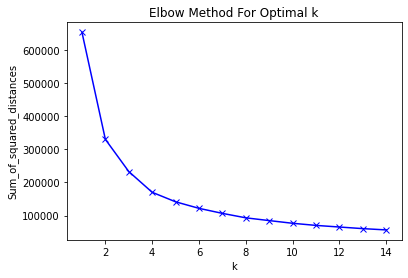

In [ ]:
plt.plot(K, Sum_of_squared_distances, 'bx-')
plt.xlabel('k')
plt.ylabel('Sum_of_squared_distances')
plt.title('Elbow Method For Optimal k')
plt.show()

We found that the optimal cluster number is 5 with **Elbow Method**.

In [ ]:
km = KMeans(n_clusters=5, init='k-means++', n_init=10, max_iter=300, random_state=1206)
# Fit and predict with 5 clusters using Principal Components
pred = km.fit_predict(pc)

In [ ]:
# Create a Dataframe for PC with target variable
df = pd.DataFrame(data = pc, columns = ['PC1', 'PC2'])

df['Clusters']=pd.Series(pred)

df = pd.concat([df, y, info], axis = 1)

df.head(10)

,PC1,PC2,Clusters,popularity,name,artists,genres
0,0.489448,0.652957,4,12,Keep A Song In Your Soul,Mamie Smith,harlem renaissance
1,0.738532,1.317988,4,0,Ah Si Vous Voulez D'l'amour,Esther Lekain,vintage chanson
2,0.771540,1.849690,4,0,Ca N'vaut Pas L'amour,Esther Lekain,vintage chanson
3,-0.064624,-1.471373,1,0,"Aero the Acrobat Title Screen (From ""Aero the ...",The Pixels,romanian rock
4,1.736326,-1.510459,1,0,"Theme from Space Harrier II (From ""Space Harri...",The Pixels,romanian rock
5,-1.749217,-0.414575,2,0,"Sonic the Hedgehog 2 Intro Theme (From ""Sonic ...",The Pixels,romanian rock
6,-1.213648,0.046509,2,0,"Intro Theme (From ""Aero the Acrobat 2"") [Genes...",The Pixels,romanian rock
7,-1.540750,-0.621000,3,2,Earthworm Jim [Genesis Mix],The Pixels,romanian rock
8,-1.042254,-1.021740,3,0,Mega Man: the Wily Wars [Genesis Mix],The Pixels,romanian rock
9,2.234750,-2.456618,0,0,"Sonic the Hedgehog Title Screen (From ""Sonic t...",The Pixels,romanian rock


**Kmeans with 3D**

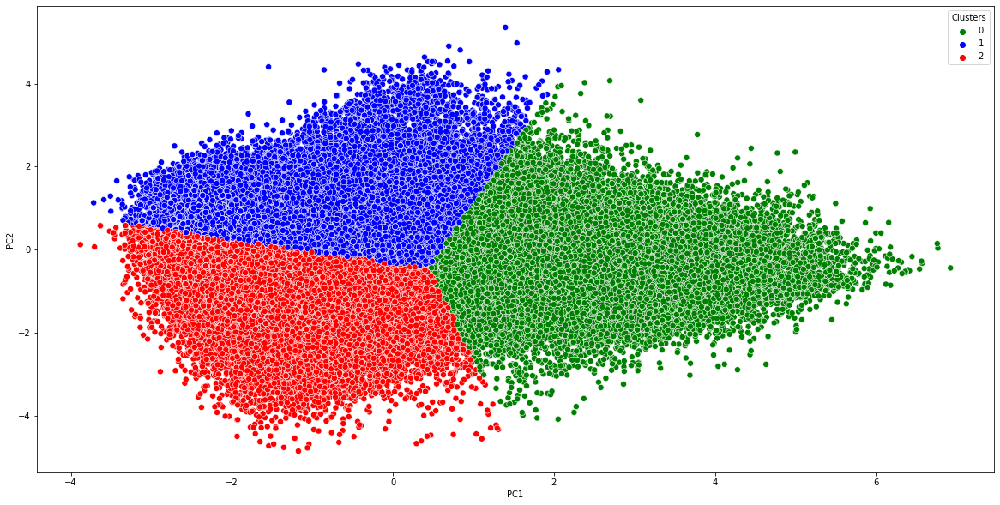

In [ ]:
# Plot using seaborn our clusterization
plt.figure(figsize=(20,10));
sns.scatterplot(x="PC1", y="PC2", hue="Clusters", data=df, palette=['green','blue','red'], s= 50);

In [ ]:
# Create a PC space with 3 components only
pca = PCA(n_components=3)

pc = pca.fit_transform(x_ss)

In [ ]:

km = KMeans(n_clusters=11, init='k-means++')

pred = km.fit_predict(pc)

df = pd.DataFrame(data = pc, columns = ['PC1', 'PC2','PC3'])

df['Clusters']=pd.Series(pred)

df = pd.concat([df, y, info], axis = 1)

df

,PC1,PC2,PC3,Clusters,popularity,name,artists,genres
0,0.489448,0.652957,0.766647,4,12,Keep A Song In Your Soul,Mamie Smith,harlem renaissance
1,0.738532,1.317988,-0.046322,4,0,Ah Si Vous Voulez D'l'amour,Esther Lekain,vintage chanson
2,0.771540,1.849690,-0.046670,4,0,Ca N'vaut Pas L'amour,Esther Lekain,vintage chanson
3,-0.064624,-1.471373,-0.872139,10,0,"Aero the Acrobat Title Screen (From ""Aero the ...",The Pixels,romanian rock
4,1.736326,-1.510459,-0.613678,1,0,"Theme from Space Harrier II (From ""Space Harri...",The Pixels,romanian rock
...,...,...,...,...,...,...,...,...
146976,-2.325441,-0.395361,-1.065279,0,0,Rompe,Daddy Yankee,latin
146977,-0.162897,-0.507434,-0.850672,10,0,ARTOFLIFE - 2021 Rework,Do Shock Booze,japanese techno
146978,-1.572749,-0.186234,-1.127367,0,0,MUDRA - 2021 Rework,Do Shock Booze,japanese techno
146979,-0.805865,-1.327046,-0.798918,2,5,When I Look At You,Miley Cyrus,dance pop


In [ ]:
import plotly.express as px
px.scatter_3d(df, x='PC1', y='PC2', z='PC3', color='Clusters')

# HYPOTHESIS TESTING 

## Statistical Tests to Check How (or if) Features Contribute to Popularity of Songs.

### Introduction: In this section, our aim is to observe how the characteristics of the songs affect the popularity of the songs.

In this part, we use the data-csv.

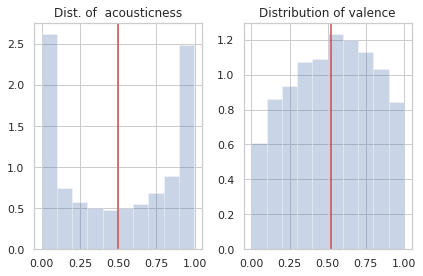

In [ ]:
fig, axes = plt.subplots(1,2)
axes[0].set_title("Dist. of  acousticness")
axes[0].hist(df['acousticness'], alpha=0.3, density=True)
axes[0].axvline(df['acousticness'].mean(), 0, 1, c="r")
axes[1].set_title("Distribution of valence")
axes[1].hist(df['valence'], alpha=0.3, density=True)
axes[1].axvline(df['valence'].mean(), 0, 1, c="r")


plt.tight_layout()
plt.show()

Mean = Sum of All Data Points / Number of Data Points.

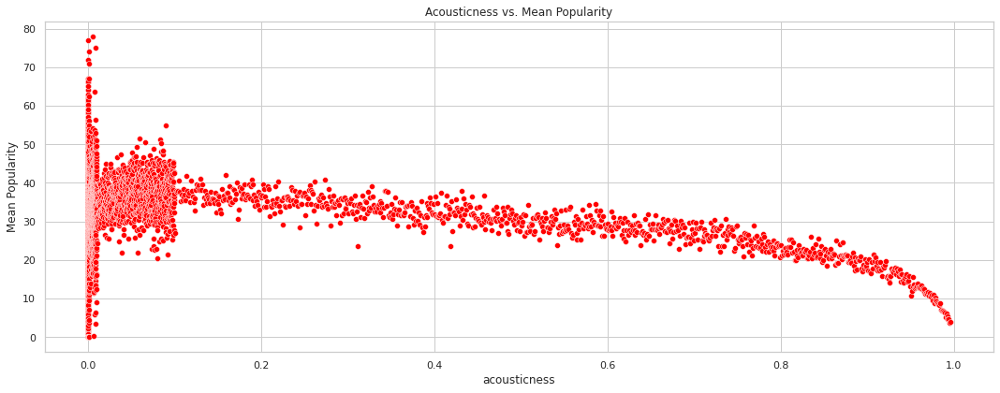

In [ ]:
fig, ax = plt.subplots(figsize=(15, 6))
ax1_data =  df.groupby('acousticness')['popularity'].mean().to_frame().reset_index()
ax = sns.scatterplot(x=ax1_data['acousticness'], y=ax1_data['popularity'], color='red', ax=ax)
ax.set_title('Acousticness vs. Mean Popularity')
ax.set_ylabel('Mean Popularity', fontsize=12)
plt.tight_layout()
plt.show()

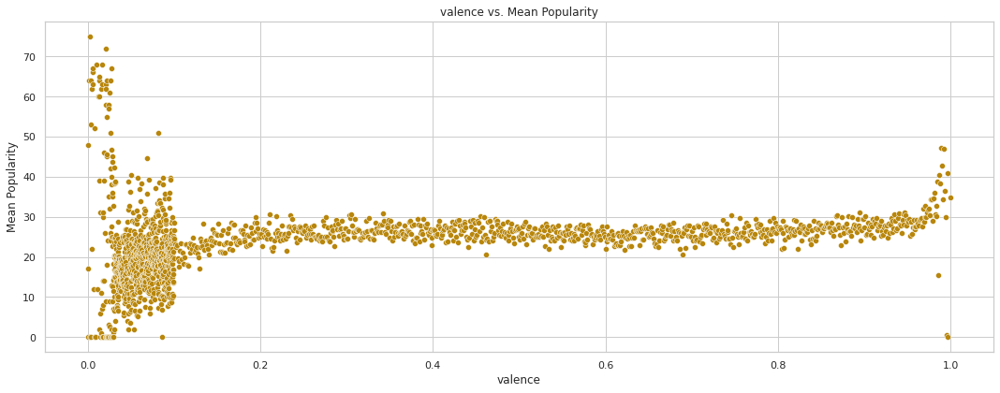

In [ ]:
fig, axes = plt.subplots(figsize=(15, 6))
ax1_data =  df.groupby('valence')['popularity'].mean().to_frame().reset_index()
axes = sns.scatterplot(x=ax1_data['valence'], y=ax1_data['popularity'], color='DARKGOLDENROD', axes=axes)
axes.set_title('valence vs. Mean Popularity')
axes.set_ylabel('Mean Popularity', fontsize=12)
plt.tight_layout()
plt.show()

As can be clearly seen in the examples above, the mean of popularity varies according to the characteristics of the songs.
Now, we need to apply a Hypothesis test to clear and prove this relationships.

### Hypothesis Test
Hypothesis Test: We want to test whether there is correlation between popularity of songs and their features or above graph is due to chance.

**Null Hypothesis ($H_0$)**: There is no correlation between 'features' and popularity of songs. For all case correlation is equal and 0.

$ H_0: \mu_{ci_1} = \mu_{ci_2} = \mu_{ci_3}$

**Alternative Hypothesis ($H_A$)**: There is correlation between 'features' and popularity of songs.For all case correlation is different.

$ H_A:$ Means $\mu_{ci_1}, \mu_{ci_2}, \mu_{ci_3}$ are not same.

**Significance Level**: As most of hypothesis tests assume significance level as `0.05`, we are setting it as `0.05` for our test too.

In [ ]:
df['popularity'].corr(df['acousticness'])

-0.39674405084944253

In [ ]:
resultp = scipy.stats.linregress(df['popularity'], df['acousticness'])

In [ ]:
resultp.pvalue

0.0

In [ ]:
resultp.stderr

3.818205042631602e-05

In [ ]:
df['popularity'].corr(df['valence'])

0.06347111097004501

In [ ]:
result1p = scipy.stats.linregress(df['popularity'], df['valence'])
result1p.pvalue

4.139279043955783e-155

In [ ]:
result1p.stderr

2.8896868085683593e-05

We can use this method for find p values and correlations. Also, we can use following method to find p values.


In [ ]:
f_stats, p_values = f_oneway(df['popularity'].values, df['acousticness'].values)
p_values

0.0

In [ ]:
f1_stats, p1_values = f_oneway(df['popularity'].values, df['valence'].values)
p1_values

0.0

### OUTRO

In the last method, we accepted the value of p-value as 0 because it is very close to 0. However, we can see the p-values of popularity and valence in the first method, and this value is very small. Therefore, this value is small in our significance value (0.05).


As p-value we obtained that is smaller than the threshold significance level 0.05, we can conclude that popularity of songs and features have a relationship. Here, we reject the null hypothesis. Also, we find that correlation of acousticness and popularity has a negatif and correlation of valence / popularity has a positive.



## Statistical Tests to Check If Significant Differences Exist Between Different Eras (like comparing features of 80s and 90s hip-hop)

### Introduction: We Need to Clear and Prepare Data for the Hypothesis Testing.

In [ ]:
justRock.head()

,year,genres,danceability,acousticness,energy,instrumentalness,liveness,loudness,tempo,valence
0,1960,album rock,0.497600,0.564000,0.538400,0.001192,0.202800,-9.284600,100.259000,0.695200
1,1960,mexican classic rock,0.469781,0.612813,0.719719,0.000890,0.295184,-9.363469,111.536437,0.837500
2,1960,mexican rock-and-roll,0.541600,0.724400,0.605000,0.001485,0.181760,-8.802400,117.341400,0.685200
3,1960,rock-and-roll,0.566667,0.500967,0.673667,0.278333,0.241333,-10.233000,151.639667,0.745333
4,1960,rockabilly,0.547000,0.475000,0.763000,0.000004,0.135000,-10.364000,166.188000,0.945000


In [ ]:
justrock8s=justRock.copy()
justrock8s=justrock8s[justrock8s['year']>= 1980]
justrock8s=justrock8s[justrock8s['year'] < 1990]
target1= 0
justrock8s['target'] = target1
justrock8s

,year,genres,danceability,acousticness,energy,instrumentalness,liveness,loudness,tempo,valence,target
262,1980,acid rock,0.465750,0.088502,0.791500,0.261105,0.389250,-9.866000,138.976750,0.664500,0
263,1980,album rock,0.514713,0.166739,0.699120,0.086073,0.257322,-8.886575,128.095490,0.564571,0
264,1980,alternative rock,0.502711,0.114585,0.732639,0.344302,0.172961,-8.920196,130.546588,0.569072,0
265,1980,art rock,0.584600,0.124208,0.704280,0.106409,0.190658,-10.148400,129.449020,0.702040,0
266,1980,australian alternative rock,0.645667,0.183767,0.713333,0.000081,0.203200,-8.574000,115.455667,0.648000,0
...,...,...,...,...,...,...,...,...,...,...,...
497,1989,peruvian rock,0.711000,0.197000,0.832000,0.000000,0.116000,-5.724000,139.197000,0.904000,0
498,1989,rock steady,0.844000,0.509000,0.425000,0.883000,0.076500,-7.081000,81.895000,0.674000,0
499,1989,roots rock,0.431500,0.020680,0.562000,0.003230,0.268800,-11.325500,98.144500,0.529500,0
500,1989,soft rock,0.453000,0.206000,0.682000,0.000000,0.092700,-8.759000,83.392000,0.546000,0


In [ ]:
justrock8s.describe()

,year,danceability,acousticness,energy,instrumentalness,liveness,loudness,tempo,valence,target
count,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.000000,240.0
mean,1984.729167,0.569606,0.216620,0.636435,0.098332,0.196346,-10.649678,124.335205,0.604480,0.0
std,2.883655,0.118081,0.191902,0.178874,0.182179,0.120147,3.048273,18.781422,0.174759,0.0
min,1980.000000,0.166000,0.000004,0.103000,0.000000,0.030000,-22.644000,77.031000,0.035700,0.0
25%,1982.000000,0.494404,0.078953,0.519300,0.000107,0.120833,-12.462312,115.694250,0.512000,0.0
50%,1985.000000,0.586750,0.170100,0.657022,0.009230,0.175550,-10.435577,124.288513,0.622208,0.0
75%,1987.000000,0.643739,0.301008,0.734523,0.110166,0.238854,-8.798894,131.763677,0.704833,0.0
max,1989.000000,0.844000,0.971000,0.993500,0.981000,0.937000,-3.295000,199.988000,0.979000,0.0


In [ ]:
justRock9s=justRock.copy()
justRock9s=justRock9s[justRock9s['year']>=1990]
justRock9s=justRock9s[justRock9s['year']< 2000]
target = 1
justRock9s['target'] = target
justRock9s

,year,genres,danceability,acousticness,energy,instrumentalness,liveness,loudness,tempo,valence,target
502,1990,acid rock,0.456000,0.462000,0.514000,0.000370,0.268000,-9.733000,138.377000,0.657000,1
503,1990,acoustic rock,0.322000,0.348000,0.676000,0.135000,0.085800,-6.922000,203.376000,0.752000,1
504,1990,album rock,0.480050,0.110940,0.769538,0.054498,0.207109,-7.683846,125.625085,0.473827,1
505,1990,alternative rock,0.467128,0.209086,0.651943,0.156576,0.183822,-10.000184,127.376429,0.523643,1
506,1990,argentine rock,0.571636,0.055603,0.713091,0.106447,0.237464,-7.652636,109.779909,0.608091,1
...,...,...,...,...,...,...,...,...,...,...,...
758,1999,modern rock,0.413667,0.204665,0.645667,0.116421,0.137217,-8.171333,123.738333,0.274167,1
759,1999,pop rock,0.509625,0.091961,0.832375,0.000234,0.187725,-5.138750,127.442500,0.485125,1
760,1999,puerto rican rock,0.457000,0.290000,0.651000,0.000006,0.038200,-7.300000,188.176000,0.908000,1
761,1999,reggae rock,0.681333,0.089430,0.671000,0.016255,0.195000,-6.466667,89.841000,0.725667,1


In [ ]:
justRock9s.describe()

,year,danceability,acousticness,energy,instrumentalness,liveness,loudness,tempo,valence,target
count,261.000000,261.000000,261.000000,261.000000,261.000000,261.000000,261.000000,261.000000,261.000000,261.0
mean,1994.455939,0.549521,0.219170,0.631892,0.093737,0.202056,-9.664991,121.039492,0.562055,1.0
std,2.910685,0.124789,0.207846,0.181128,0.188188,0.143219,3.384522,21.398573,0.193732,0.0
min,1990.000000,0.146000,0.000021,0.022300,0.000000,0.026700,-23.715000,73.249000,0.040400,1.0
25%,1992.000000,0.464931,0.053760,0.514000,0.000111,0.112000,-11.553000,107.592333,0.441344,1.0
50%,1994.000000,0.549667,0.159750,0.648714,0.008085,0.164000,-9.264723,121.113074,0.553352,1.0
75%,1997.000000,0.628333,0.298036,0.741615,0.100882,0.239500,-7.358000,132.756778,0.692333,1.0
max,1999.000000,0.928000,0.926000,0.993000,0.949000,0.950000,-1.987000,203.376000,0.977000,1.0


In [ ]:
vertical_stack = pd.concat([justrock8s, justRock9s], axis=0)
vertical_stack

,year,genres,danceability,acousticness,energy,instrumentalness,liveness,loudness,tempo,valence,target
262,1980,acid rock,0.465750,0.088502,0.791500,0.261105,0.389250,-9.866000,138.976750,0.664500,0
263,1980,album rock,0.514713,0.166739,0.699120,0.086073,0.257322,-8.886575,128.095490,0.564571,0
264,1980,alternative rock,0.502711,0.114585,0.732639,0.344302,0.172961,-8.920196,130.546588,0.569072,0
265,1980,art rock,0.584600,0.124208,0.704280,0.106409,0.190658,-10.148400,129.449020,0.702040,0
266,1980,australian alternative rock,0.645667,0.183767,0.713333,0.000081,0.203200,-8.574000,115.455667,0.648000,0
...,...,...,...,...,...,...,...,...,...,...,...
758,1999,modern rock,0.413667,0.204665,0.645667,0.116421,0.137217,-8.171333,123.738333,0.274167,1
759,1999,pop rock,0.509625,0.091961,0.832375,0.000234,0.187725,-5.138750,127.442500,0.485125,1
760,1999,puerto rican rock,0.457000,0.290000,0.651000,0.000006,0.038200,-7.300000,188.176000,0.908000,1
761,1999,reggae rock,0.681333,0.089430,0.671000,0.016255,0.195000,-6.466667,89.841000,0.725667,1


### Hypothesis Testing 

Sample Hypothesis Test

Hypothesis Test: We want to test whether there is significant differences in terms of eras of rock for different features.

**Null Hypothesis ($H_0$)**: Means of ` eras of rock` samples for all target values are same (e.g. $ci_1$ denotes 1st eras of rock sample).

$ H_0: \mu_{ci_1} = \mu_{ci_2} = \mu_{ci_3}$

**Alternative Hypothesis ($H_A$)**: Means of ` eras of rock` samples for all target values are different.

$ H_A:$ Means $\mu_{ci_1}, \mu_{ci_2}, \mu_{ci_3}$ are not same.

**Significance Level**: As most of hypothesis tests assume significance level as `0.05`, we are setting it as `0.05` for our test too.

Text(0.5, 0, 'Year')

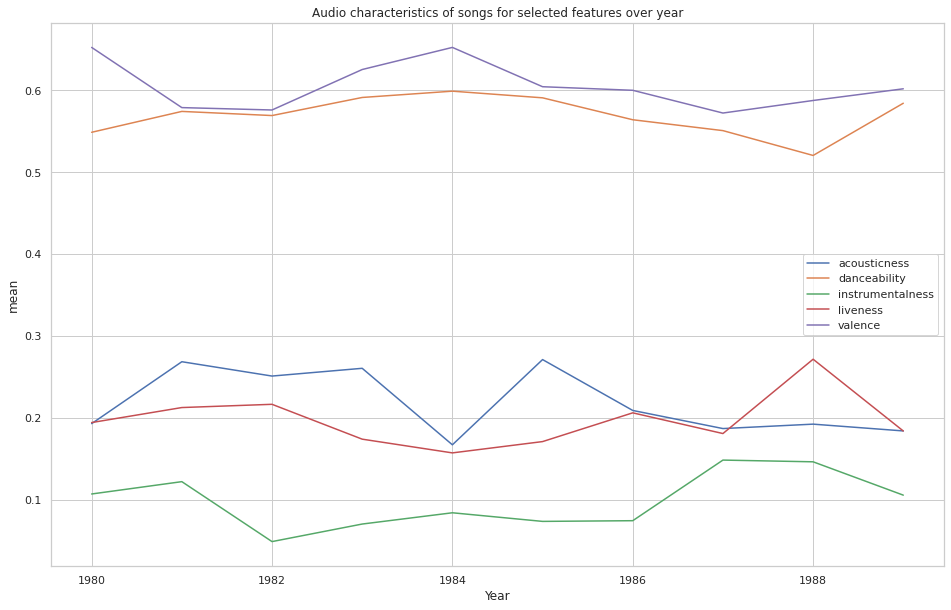

In [ ]:
plt.figure(figsize=(16, 10))
sns.set(style="whitegrid")
columns = ["acousticness","danceability","instrumentalness","liveness","valence"]
for col in columns:
    x = justrock8s.groupby("year")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col)
ax.set_title('Audio characteristics of songs for selected features over year')
ax.set_ylabel('mean')
ax.set_xlabel('Year')

Text(0.5, 0, 'Year')

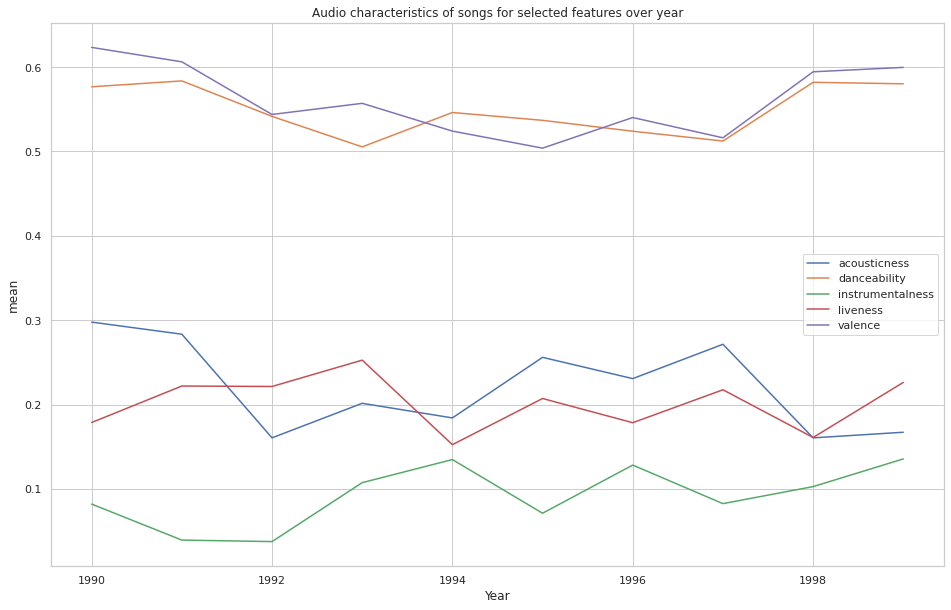

In [ ]:
plt.figure(figsize=(16, 10))
sns.set(style="whitegrid")
columns = ["acousticness","danceability","instrumentalness","liveness","valence"]
for col in columns:
    x = justRock9s.groupby("year")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col)
ax.set_title('Audio characteristics of songs for selected features over year')
ax.set_ylabel('mean')
ax.set_xlabel('Year')

In [ ]:
sample_1, sample_2 = [vertical_stack[vertical_stack['target'] == i] for i in vertical_stack.target.unique()]

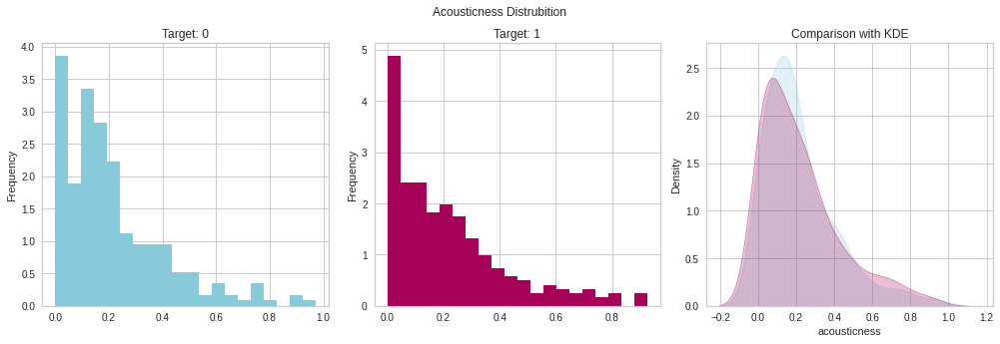

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(14,5))
        
sample_1['acousticness'].plot(kind="hist", ax=ax[0], bins=20, label="completed", color="c", density=True)
ax[0].set_title("Target: 0")

sample_2['acousticness'].plot(kind="hist", ax=ax[1], bins=20, label="none", color="m", density=True)
ax[1].set_title("Target: 1")


sns.kdeplot(sample_1['acousticness'], shade=True, label="Target: 0", ax=ax[2], color="c")
sns.kdeplot(sample_2['acousticness'], shade=True, label="Target: 1", ax=ax[2], color="m")

ax[2].set_title("Comparison with KDE")

plt.suptitle("Acousticness Distrubition")
# To avoid suptitle and titles of ax titles colliding
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

P-value for Acousticness in 80s-90s Rock

In [ ]:
f3_stats, p3_values = f_oneway(sample_1['acousticness'].values, sample_2['acousticness'].values)
p3_values

0.8868940844575355

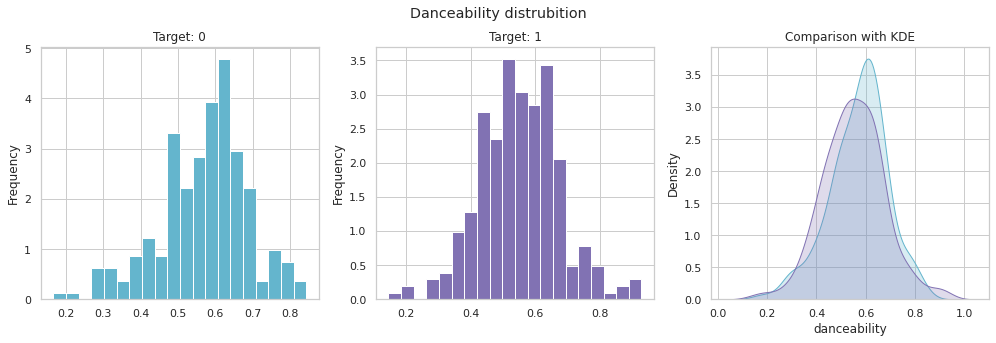

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(14,5))
        
sample_1['danceability'].plot(kind="hist", ax=ax[0], bins=20, label="completed", color="c", density=True)
ax[0].set_title("Target: 0")

sample_2['danceability'].plot(kind="hist", ax=ax[1], bins=20, label="none", color="m", density=True)
ax[1].set_title("Target: 1")


sns.kdeplot(sample_1['danceability'], shade=True, label="Target: 0", ax=ax[2], color="c")
sns.kdeplot(sample_2['danceability'], shade=True, label="Target: 1", ax=ax[2], color="m")

ax[2].set_title("Comparison with KDE")

plt.suptitle("Danceability distrubition")
# To avoid suptitle and titles of ax titles colliding
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

P-value for Danceability in 80s-90s Rock

In [ ]:
f4_stats, p4_values = f_oneway(sample_1['danceability'].values, sample_2['danceability'].values)
p4_values

0.0654017910281978

### Conclusion



As seen above, The p-values of the rock type in terms of acousticness and danceability are greater than the signifiance value(0.05). Therefore, we have to accept Null Hypothesis. Consequently, the mean of acousticness and danceability in rock from 80-90 is the same.

## Statistical Tests on Sub-genres (investigating if there are Significant Statistical Differences in Features of Different Sub-genres of the Same Parent Genre, eg. Comparing Features of British Rock and Anadolu Rock Songs).

### Introduction: In this section, we use dataofrock data and dataofrap that we created before and we use these data for concating new dataframes.

In [ ]:
dataOfRock.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,genres
122243,0.00316,The Pixels,0.417,108000,0.453,0,0cmhlfd5JitfzZMer2aTJN,0.9460,2,0.174,-7.019,0,"Aero the Acrobat Title Screen (From ""Aero the ...",0,1920-01-04,0.0314,142.117,0.470,1920,romanian rock
122244,0.97600,The Pixels,0.294,149500,0.444,0,1KdknRJ03Ny7WjyrOwENGo,0.8940,5,0.131,-5.248,1,"Theme from Space Harrier II (From ""Space Harri...",0,1920-01-04,0.0352,113.080,0.127,1920,romanian rock
122245,0.11400,The Pixels,0.525,22922,0.568,0,2qMnMGB9QtigWHUetCjeXE,0.0922,0,0.257,-4.788,1,"Sonic the Hedgehog 2 Intro Theme (From ""Sonic ...",0,1920-01-04,0.0888,150.142,0.766,1920,romanian rock
122246,0.10600,The Pixels,0.643,84312,0.758,0,3pyszFWfJTEpZo90i75Bvx,0.9430,0,0.257,-9.279,1,"Intro Theme (From ""Aero the Acrobat 2"") [Genes...",0,1920-01-04,0.0418,120.064,0.972,1920,romanian rock
122247,0.01310,The Pixels,0.674,106500,0.662,0,4IYIlWb2o8ifdUZeNNjQx8,0.1780,2,0.328,-10.648,1,Earthworm Jim [Genesis Mix],2,1920-01-04,0.0695,165.993,0.531,1920,romanian rock


In [ ]:
dataOfRock['genres'].value_counts()[:10]

album rock          12082
alternative rock     3225
classic rock         2351
art rock             1629
dance rock           1243
blues rock            838
acid rock             489
country rock          394
modern rock           384
irish rock            261
Name: genres, dtype: int64

In [ ]:
art_rock=dataOfRock[dataOfRock['genres']=='art rock'] 
dance_rock=dataOfRock[dataOfRock['genres']=='dance rock']
vertical_stack_2 = pd.concat([art_rock, dance_rock], axis=0)
vertical_stack_2

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,genres
30725,0.879000,Aztec Camera,0.168,280067,0.0668,0,78OYt83l6R7jkh3CawbfsG,0.000106,2,0.0705,-19.519,1,Do I Love You?,7,1939,0.0345,170.686,0.0669,1939,art rock
141171,0.507000,Moondog,0.542,110200,0.3780,0,53c5JSgiflNzkCzH6Sndld,0.762000,6,0.1090,-18.753,1,Big Cat,12,1956,0.0567,93.619,0.6090,1956,art rock
141172,0.693000,Moondog,0.306,415533,0.9210,0,6s5ObKZSyybTlCdrzs9qmS,0.623000,5,0.1520,-10.498,1,Surf Session,12,1956,0.5020,84.051,0.6130,1956,art rock
141173,0.099600,Moondog,0.446,217667,0.5250,0,0ovReyMT7rnjvAN8ECueQm,0.065200,6,0.2780,-18.860,1,Street Scene,9,1956,0.4850,172.733,0.1930,1956,art rock
141174,0.410000,Moondog,0.657,50773,0.3730,0,18bblBN6BAgRQJKs2KpFwX,0.000001,0,0.8020,-18.445,1,Dance Rehearsal,10,1956,0.3510,55.808,0.9750,1956,art rock
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91426,0.000082,Dead Or Alive,0.680,267865,0.7490,0,0VOthLnfbcEzmKTtbrhUrg,0.783000,1,0.1290,-10.367,0,You Spin Me Round (Like a Record) [Re-Recorded...,0,2012-12-14,0.0582,128.375,0.9610,2012,dance rock
95020,0.012200,Information Society,0.876,278825,0.6190,0,3GNsr5oDlJcT2mlQ6b39K8,0.033000,7,0.3190,-10.834,1,What's On Your Mind (Pure Energy) [Re-Recorded...,0,2012-12-14,0.0864,117.987,0.6770,2012,dance rock
89482,0.031000,Real Life,0.663,236936,0.7880,0,4foEsbXfOkTfNMNE9x5Q00,0.000000,2,0.1660,-7.754,0,Send Me an Angel (Re-Recorded) [Remastered],0,2012-12-14,0.0300,127.968,0.6160,2012,dance rock
171479,0.001320,Midge,0.797,458895,0.7710,0,6TOGj5rF9zshwEHst1i2O7,0.774000,10,0.1160,-6.213,0,Have You Ever - Original Mix,0,2014-12-08,0.0509,124.991,0.1840,2014,dance rock


### Hypothesis Testing For Sub-genres of Rock.

In [ ]:
sample_3, sample_4 = [vertical_stack_2[vertical_stack_2['genres'] == i] for i in vertical_stack_2.genres.unique()]

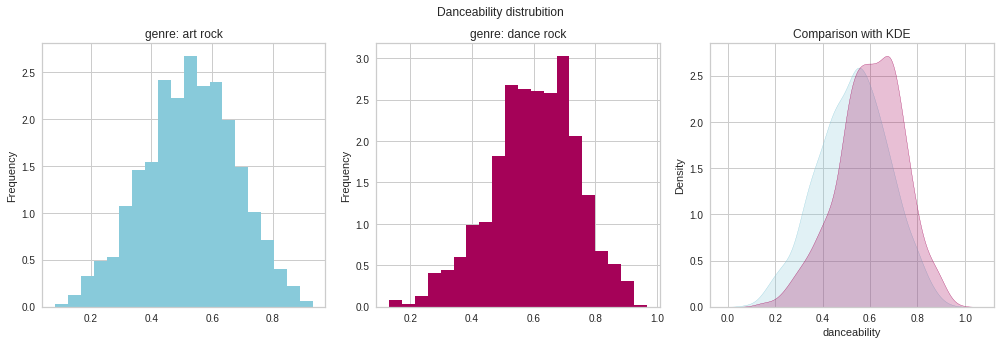

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(14,5))
        
sample_3['danceability'].plot(kind="hist", ax=ax[0], bins=20, label="completed", color="c", density=True)
ax[0].set_title("genre: art rock")

sample_4['danceability'].plot(kind="hist", ax=ax[1], bins=20, label="none", color="m", density=True)
ax[1].set_title("genre: dance rock")


sns.kdeplot(sample_3['danceability'], shade=True, label="genre: art rock", ax=ax[2], color="c")
sns.kdeplot(sample_4['danceability'], shade=True, label="Target: dance rock", ax=ax[2], color="m")

ax[2].set_title("Comparison with KDE")

plt.suptitle("Danceability distrubition")
# To avoid suptitle and titles of ax titles colliding
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

P-value for Danceability in Art rock and Dance Rock

In [ ]:
f4_stats, p4_values = f_oneway(sample_3['danceability'].values, sample_4['danceability'].values)
p4_values

8.988726042214728e-40

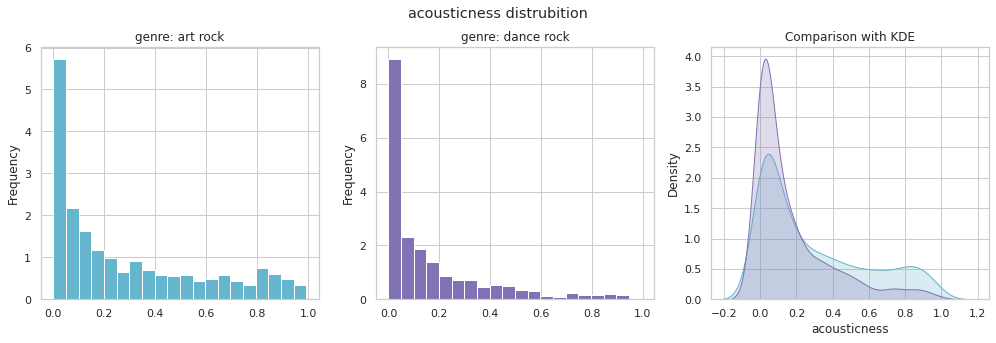

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(14,5))
        
sample_3['acousticness'].plot(kind="hist", ax=ax[0], bins=20, label="completed", color="c", density=True)
ax[0].set_title("genre: art rock")

sample_4['acousticness'].plot(kind="hist", ax=ax[1], bins=20, label="none", color="m", density=True)
ax[1].set_title("genre: dance rock")


sns.kdeplot(sample_3['acousticness'], shade=True, label="genre: art rock", ax=ax[2], color="c")
sns.kdeplot(sample_4['acousticness'], shade=True, label="Target: dance rock", ax=ax[2], color="m")

ax[2].set_title("Comparison with KDE")

plt.suptitle("acousticness distrubition")
# To avoid suptitle and titles of ax titles colliding
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

P-value for Acousticness in Art rock and Dance Rock

In [ ]:
f5_stats, p5_values = f_oneway(sample_3['acousticness'].values, sample_4['acousticness'].values)
p5_values

2.749386182148195e-35

### Conclusion for Hypothesis Testing of Sub-genres of Rock.

In this section, the 2 subgenres of rock, dance rock and art rock, were compared in terms of danceability and acousticness. Their p-values are less than their signifiance value(0.05). Hence, we cannot accept Null Hypothesis.

### Hypothesis Testing for Sub-genres of Rap.




In [ ]:
dataOfRap['genres'].value_counts() [0:10]

chicago rap        312
melodic rap        214
dirty south rap    183
cali rap           182
gangster rap       165
chicano rap        153
emo rap            144
dark trap          109
country rap         93
baton rouge rap     80
Name: genres, dtype: int64

In [ ]:
chicago_rap=dataOfRap[dataOfRap['genres']=='chicago rap'] 
melodic_rap=dataOfRap[dataOfRap['genres']=='melodic rap']
vertical_stack_3 = pd.concat([chicago_rap, melodic_rap], axis=0)
vertical_stack_3

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,genres
153422,0.814000,Family,0.630,260893,0.244,0,0piBgpX4QTTWdPTOGnkFHJ,0.001450,9,0.1030,-17.132,0,My Friend the Sun,32,1972,0.0262,81.073,0.5780,1972,chicago rap
160984,0.093000,Conflict,0.336,182547,0.907,1,586kvk2wGWpasPqGIUGsTj,0.451000,4,0.1140,-6.085,1,The Serenade Is Dead,33,1984,0.3450,156.819,0.2150,1984,chicago rap
167702,0.099200,King,0.708,201387,0.611,0,3oGcHyoXwBMIAXkgIzLoQn,0.000025,9,0.0889,-9.889,0,Love & Pride,43,1984-09-26,0.0378,126.093,0.7990,1984,chicago rap
160985,0.111000,Conflict,0.231,229547,0.983,1,60u6pJROq3Hd2BGQoeJn18,0.051100,0,0.4270,-5.731,1,Mighty and Superior,27,1986,0.2840,81.602,0.0973,1986,chicago rap
157009,0.000016,Tad,0.240,210533,0.863,0,3YsG8BwqrJzM3DOqYpFLp0,0.416000,11,0.0944,-8.046,0,Leafy Incline,43,1993,0.0402,75.591,0.3310,1993,chicago rap
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121181,0.084700,Lil Tecca,0.732,153627,0.636,1,0IJA9KP6rT55jrP1YpTdhx,0.000000,7,0.2410,-6.162,0,Out Of Love (feat. Internet Money),73,2020-09-18,0.0497,138.061,0.3580,2020,melodic rap
121281,0.276000,iann dior,0.732,133608,0.511,1,3fKdTr6Uv8HTb92Ih3QWxa,0.000000,6,0.0916,-6.779,1,Pretty Girls,73,2020-06-12,0.0541,96.946,0.6200,2020,melodic rap
121282,0.203000,iann dior,0.816,226314,0.579,1,4iHSE5R1U8jf84tRn52xRt,0.000000,1,0.1270,-6.097,1,Prospect (ft. Lil Baby),72,2020-06-12,0.0867,120.078,0.4300,2020,melodic rap
121283,0.203000,iann dior,0.816,226314,0.579,1,4Zjdzxx0dsavsr7Ehr8fGE,0.000000,1,0.1270,-6.097,1,Prospect (ft. Lil Baby),69,2020-05-22,0.0867,120.078,0.4300,2020,melodic rap


In [ ]:
sample_5, sample_6 = [vertical_stack_3[vertical_stack_3['genres'] == i] for i in vertical_stack_3.genres.unique()]

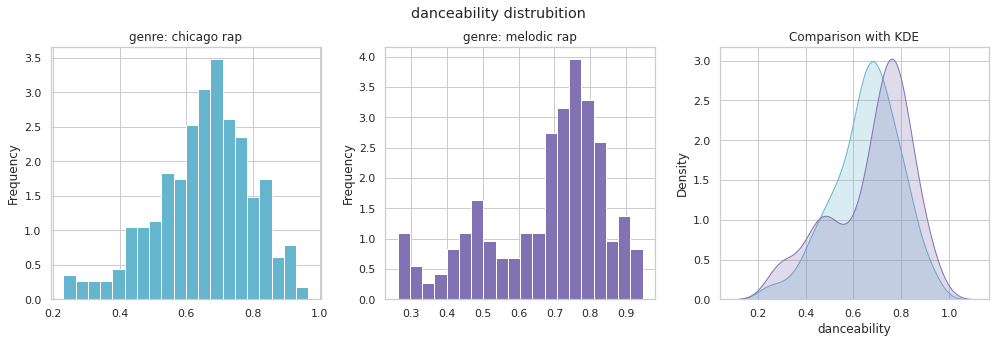

In [ ]:
ig, ax = plt.subplots(1, 3, figsize=(14,5))
        
sample_5['danceability'].plot(kind="hist", ax=ax[0], bins=20, label="completed", color="c", density=True)
ax[0].set_title("genre: chicago rap")

sample_6['danceability'].plot(kind="hist", ax=ax[1], bins=20, label="none", color="m", density=True)
ax[1].set_title("genre: melodic rap")


sns.kdeplot(sample_5['danceability'], shade=True, label="genre: chicago rap", ax=ax[2], color="c")
sns.kdeplot(sample_6['danceability'], shade=True, label="Target: melodic rap", ax=ax[2], color="m")

ax[2].set_title("Comparison with KDE")

plt.suptitle("danceability distrubition")
# To avoid suptitle and titles of ax titles colliding
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

P-value for Danceability in Chicago Rap and Melodic Rap

In [ ]:
f6_stats, p6_values = f_oneway(sample_5['danceability'].values, sample_6['danceability'].values)
p6_values

0.10040678350418698

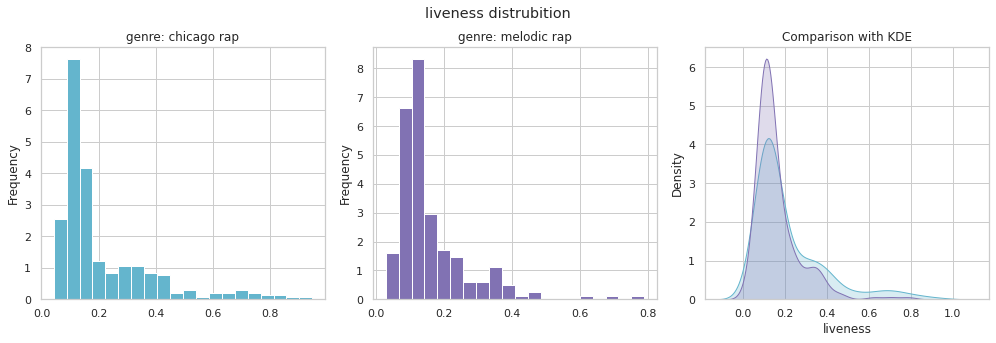

In [ ]:
ig, ax = plt.subplots(1, 3, figsize=(14,5))
        
sample_5['liveness'].plot(kind="hist", ax=ax[0], bins=20, label="completed", color="c", density=True)
ax[0].set_title("genre: chicago rap")

sample_6['liveness'].plot(kind="hist", ax=ax[1], bins=20, label="none", color="m", density=True)
ax[1].set_title("genre: melodic rap")


sns.kdeplot(sample_5['liveness'], shade=True, label="genre: chicago rap", ax=ax[2], color="c")
sns.kdeplot(sample_6['liveness'], shade=True, label="Target: melodic rap", ax=ax[2], color="m")

ax[2].set_title("Comparison with KDE")

plt.suptitle("liveness distrubition")
# To avoid suptitle and titles of ax titles colliding
plt.tight_layout(rect=[0, 0.03, 1, 0.95])
plt.show()

P-value for liveness in Chicago Rap and Melodic Rap

In [ ]:
f7_stats, p7_values = f_oneway(sample_5['liveness'].values, sample_6['liveness'].values)
p7_values

6.46681854768792e-05

### Conclusion for Hypothesis Testing of Sub-genres of Rap.

In this section, chicago rap and melodic rap, two sub-types of rap, are examined in terms of danceability and liveness. In the danceability part, we can accept Null Hypothesis since p-value is greater than the signifiance value. However, the liveness part is the opposite of the danceability part. P-value is less than signifiance value(0.05). Thus, we cannot accept Null Hypothesis.

#EXPLOTARY DATA ANALYSIS 








*   Visualizations descriptive statistics of the dataset; visual explanations of features & sharing distributions
*   Example visualizations of aggregated forms based on features
*   Analysis of the most popular artists and songs.
*   Temporal analysis of feature
*   Comparison of features of sub-genres for selected parent genres over time periods


In [ ]:
#from google.colab import drive
#drive.mount('./drive', force_remount=True)

#path_prefix = "./drive/My Drive/"

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from os.path import join
import warnings
import seaborn as sns
from sklearn import datasets
import numpy as np
import scipy.stats
from scipy.stats import f_oneway
%matplotlib inline



#read the dataset and display the first five rows of it
warnings.filterwarnings('ignore')
df=pd.read_csv("data.csv")
df_genres=pd.read_csv("data_by_genres.csv")
df_year=pd.read_csv("data_by_year.csv")
df_artist=pd.read_csv("data_by_artist.csv")
df_w_genres=pd.read_csv("data_w_genres.csv")
df.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
0,0.991000,['Mamie Smith'],0.598,168333,0.224,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.6340,1920
1,0.643000,"[""Screamin' Jay Hawkins""]",0.852,150200,0.517,0,0hbkKFIJm7Z05H8Zl9w30f,0.026400,5,0.0809,-7.261,0,I Put A Spell On You,7,1920-01-05,0.0534,86.889,0.9500,1920
2,0.993000,['Mamie Smith'],0.647,163827,0.186,0,11m7laMUgmOKqI3oYzuhne,0.000018,0,0.5190,-12.098,1,Golfing Papa,4,1920,0.1740,97.600,0.6890,1920
3,0.000173,['Oscar Velazquez'],0.730,422087,0.798,0,19Lc5SfJJ5O1oaxY0fpwfh,0.801000,2,0.1280,-7.311,1,True House Music - Xavier Santos & Carlos Gomi...,17,1920-01-01,0.0425,127.997,0.0422,1920
4,0.295000,['Mixe'],0.704,165224,0.707,1,2hJjbsLCytGsnAHfdsLejp,0.000246,10,0.4020,-6.036,0,Xuniverxe,2,1920-10-01,0.0768,122.076,0.2990,1920


In [ ]:
#info
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 174389 entries, 0 to 174388
Data columns (total 19 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   acousticness      174389 non-null  float64
 1   artists           174389 non-null  object 
 2   danceability      174389 non-null  float64
 3   duration_ms       174389 non-null  int64  
 4   energy            174389 non-null  float64
 5   explicit          174389 non-null  int64  
 6   id                174389 non-null  object 
 7   instrumentalness  174389 non-null  float64
 8   key               174389 non-null  int64  
 9   liveness          174389 non-null  float64
 10  loudness          174389 non-null  float64
 11  mode              174389 non-null  int64  
 12  name              174389 non-null  object 
 13  popularity        174389 non-null  int64  
 14  release_date      174389 non-null  object 
 15  speechiness       174389 non-null  float64
 16  tempo             17

In [ ]:
df_w_genres.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32539 entries, 0 to 32538
Data columns (total 16 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   artists           32539 non-null  object 
 1   acousticness      32539 non-null  float64
 2   danceability      32539 non-null  float64
 3   duration_ms       32539 non-null  float64
 4   energy            32539 non-null  float64
 5   instrumentalness  32539 non-null  float64
 6   liveness          32539 non-null  float64
 7   loudness          32539 non-null  float64
 8   speechiness       32539 non-null  float64
 9   tempo             32539 non-null  float64
 10  valence           32539 non-null  float64
 11  popularity        32539 non-null  float64
 12  key               32539 non-null  int64  
 13  mode              32539 non-null  int64  
 14  count             32539 non-null  int64  
 15  genres            32539 non-null  object 
dtypes: float64(11), int64(3), object(2)
memo

In [ ]:
#check if any missing data
df.isna().sum()

acousticness        0
artists             0
danceability        0
duration_ms         0
energy              0
explicit            0
id                  0
instrumentalness    0
key                 0
liveness            0
loudness            0
mode                0
name                0
popularity          0
release_date        0
speechiness         0
tempo               0
valence             0
year                0
dtype: int64

In [ ]:
#check if any missing data
df_w_genres.isna().sum()

artists             0
acousticness        0
danceability        0
duration_ms         0
energy              0
instrumentalness    0
liveness            0
loudness            0
speechiness         0
tempo               0
valence             0
popularity          0
key                 0
mode                0
count               0
genres              0
dtype: int64

In [ ]:
df.describe()

,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo,valence,year
count,174389.000000,174389.000000,1.743890e+05,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000,174389.000000
mean,0.499228,0.536758,2.328100e+05,0.482721,0.068135,0.197252,5.205305,0.211123,-11.750865,0.702384,25.693381,0.105729,117.006500,0.524533,1977.061764
std,0.379936,0.176025,1.483958e+05,0.272685,0.251978,0.334574,3.518292,0.180493,5.691591,0.457211,21.872740,0.182260,30.254178,0.264477,26.907950
min,0.000000,0.000000,4.937000e+03,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1920.000000
25%,0.087700,0.414000,1.661330e+05,0.249000,0.000000,0.000000,2.000000,0.099200,-14.908000,0.000000,1.000000,0.035200,93.931000,0.311000,1955.000000
50%,0.517000,0.548000,2.057870e+05,0.465000,0.000000,0.000524,5.000000,0.138000,-10.836000,1.000000,25.000000,0.045500,115.816000,0.536000,1977.000000
75%,0.895000,0.669000,2.657200e+05,0.711000,0.000000,0.252000,8.000000,0.270000,-7.499000,1.000000,42.000000,0.076300,135.011000,0.743000,1999.000000
max,0.996000,0.988000,5.338302e+06,1.000000,1.000000,1.000000,11.000000,1.000000,3.855000,1.000000,100.000000,0.971000,243.507000,1.000000,2021.000000


In [ ]:
df_w_genres.describe()

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,count
count,32539.000000,32539.000000,3.253900e+04,32539.000000,32539.000000,32539.000000,32539.000000,32539.000000,32539.000000,32539.000000,32539.000000,32539.000000,32539.000000,32539.000000
mean,0.455682,0.552737,2.485982e+05,0.525908,0.233281,0.209035,-11.008171,0.092047,117.433745,0.498812,24.473452,5.459787,0.734903,12.561818
std,0.383678,0.176445,1.581808e+05,0.267402,0.334487,0.151781,5.568630,0.111257,24.467506,0.247154,23.021041,3.473653,0.441392,52.407821
min,0.000000,0.000000,8.042000e+03,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000
25%,0.055155,0.436487,1.804616e+05,0.299000,0.000012,0.109000,-13.792500,0.039700,100.983500,0.305792,0.000000,2.000000,0.000000,2.000000
50%,0.391833,0.563000,2.215070e+05,0.537375,0.009550,0.162000,-9.887000,0.052822,118.779000,0.506000,22.666667,6.000000,1.000000,2.000000
75%,0.876000,0.684500,2.815870e+05,0.747039,0.451149,0.259500,-6.944500,0.090800,130.552000,0.691500,43.141941,8.000000,1.000000,7.000000
max,0.996000,0.987000,4.696690e+06,1.000000,1.000000,0.986000,3.367000,0.971000,219.833000,0.997000,94.000000,11.000000,1.000000,3179.000000


In [ ]:
df1= pd.DataFrame(df['year'])
df1.value_counts()[0:25].to_dict()

{(1968,): 2025,
 (1969,): 2018,
 (1970,): 2017,
 (1971,): 2025,
 (1972,): 2014,
 (1974,): 2017,
 (1975,): 2021,
 (1978,): 2013,
 (1980,): 2040,
 (1991,): 2121,
 (1993,): 2014,
 (1994,): 2019,
 (1996,): 2021,
 (1997,): 2027,
 (1998,): 2034,
 (1999,): 2075,
 (2002,): 2055,
 (2013,): 2622,
 (2014,): 2252,
 (2015,): 2300,
 (2016,): 2349,
 (2017,): 2156,
 (2018,): 2714,
 (2019,): 2329,
 (2020,): 4294}

Here, it can be seen that the data set called data.csv, which we are examining, contains tracks between 1920 and 2021. It can be observed that it contains approximately 1000 to 2000 different track information for each year. In this context, it would be correct to examine the distribution of specific characteristics in sub-groups by fewer years periods such as 10 years.


#Visualizations descriptive statistics of the dataset;


>  Visual explanations of features & sharing distributions





*  Shape of the dataset,
*  Data types of columns,
*  Number of missing values for each column



A measure of central tendency is a single value that attempts to describe a set of data by identifying the central position within that set of data.


*   Mean
*   Median


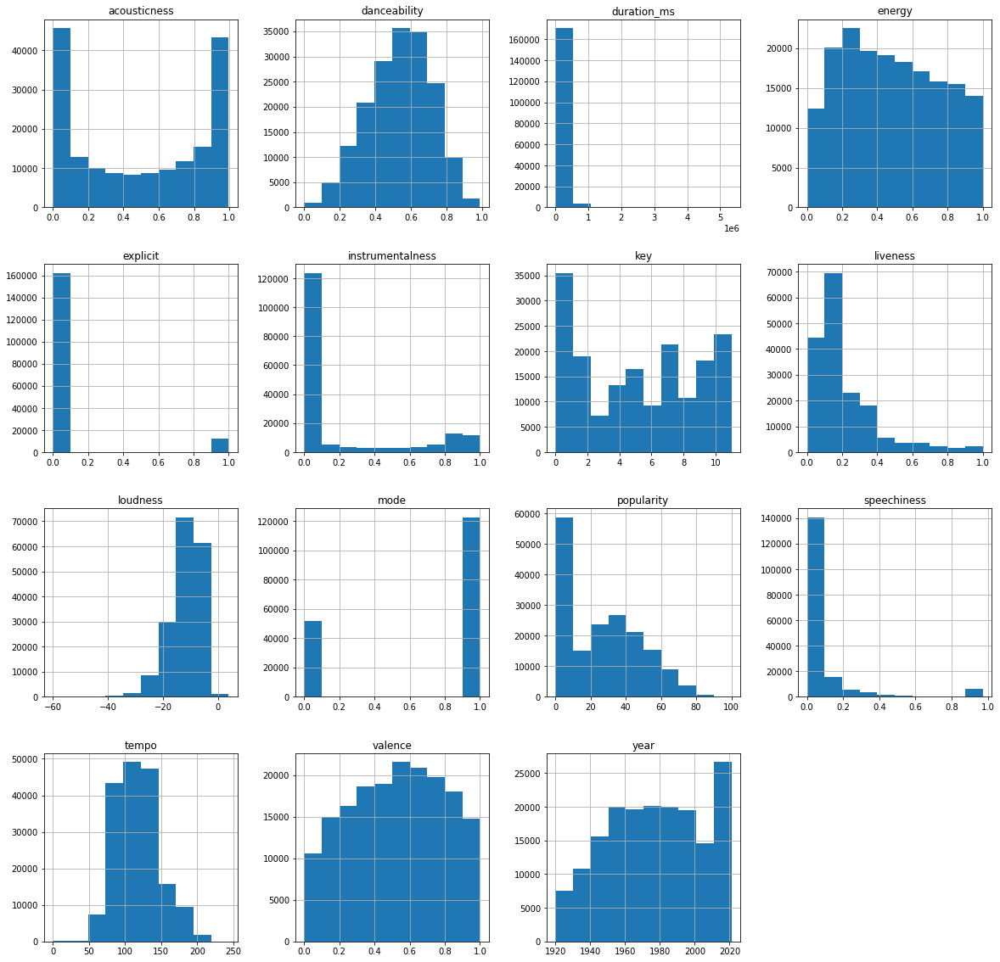

In [ ]:
df.hist(figsize=(20,20))
plt.show()

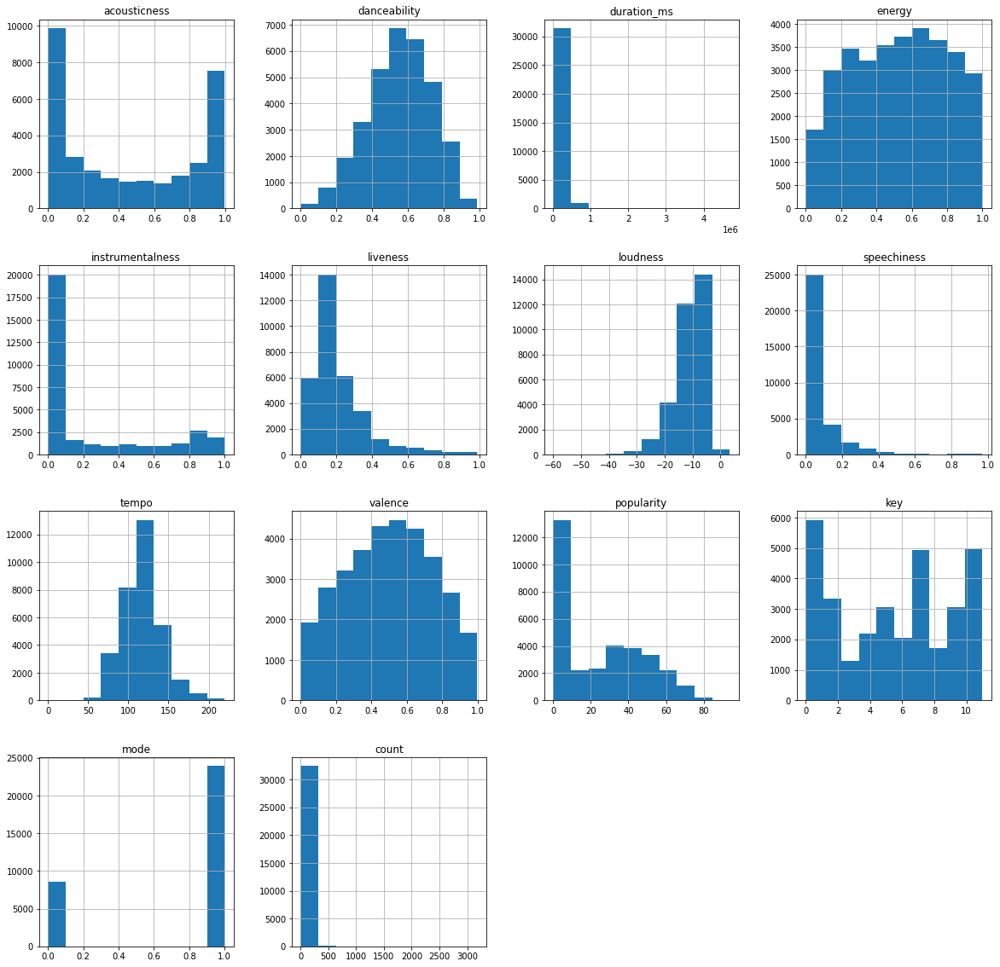

In [ ]:
df_w_genres.hist(figsize=(20,20))
plt.show()

In [ ]:
df.groupby(by='year')['danceability'].mean()

year
1920    0.515750
1921    0.432171
1922    0.575620
1923    0.577341
1924    0.549894
          ...   
2017    0.580475
2018    0.602731
2019    0.603101
2020    0.605285
2021    0.652488
Name: danceability, Length: 102, dtype: float64

In [ ]:
df.groupby(by='year')['danceability'].median().head()

year
1920    0.5260
1921    0.3945
1922    0.5920
1923    0.5870
1924    0.5640
Name: danceability, dtype: float64

In [ ]:
df.groupby(by='year')['acousticness'].mean()

year
1920    0.631242
1921    0.862105
1922    0.828934
1923    0.957247
1924    0.940200
          ...   
2017    0.207413
2018    0.233836
2019    0.261344
2020    0.202303
2021    0.340253
Name: acousticness, Length: 102, dtype: float64

In [ ]:
df.groupby(by='year')['acousticness'].median().head()

year
1920    0.884
1921    0.982
1922    0.972
1923    0.990
1924    0.994
Name: acousticness, dtype: float64

In [ ]:
df.groupby(by='year')['duration_ms'].mean()

year
1920    238092.997135
1921    257891.762821
1922    140135.140496
1923    177942.362162
1924    191046.707627
            ...      
2017    243402.249536
2018    227073.140015
2019    225463.326320
2020    218977.482767
2021    222760.028261
Name: duration_ms, Length: 102, dtype: float64

In [ ]:
df.groupby(by='year')['duration_ms'].median().head()

year
1920    195253.0
1921    188675.0
1922    142700.0
1923    179667.0
1924    173786.5
Name: duration_ms, dtype: float64

In [ ]:
df.groupby(by='year')['instrumentalness'].mean()

year
1920    0.354219
1921    0.337158
1922    0.254776
1923    0.371733
1924    0.581701
          ...   
2017    0.247068
2018    0.229874
2019    0.221123
2020    0.249008
2021    0.356765
Name: instrumentalness, Length: 102, dtype: float64

In [ ]:
df.groupby(by='year')['instrumentalness'].median().head()

year
1920    0.11100
1921    0.05525
1922    0.00000
1923    0.10800
1924    0.84400
Name: instrumentalness, dtype: float64

In [ ]:
df.groupby(by='year')['liveness'].mean()

year
1920    0.216049
1921    0.205219
1922    0.256662
1923    0.227462
1924    0.235219
          ...   
2017    0.231513
2018    0.231009
2019    0.218501
2020    0.234415
2021    0.162309
Name: liveness, Length: 102, dtype: float64

In [ ]:
df.groupby(by='year')['liveness'].median().head()

year
1920    0.1600
1921    0.1455
1922    0.2020
1923    0.1650
1924    0.1805
Name: liveness, dtype: float64

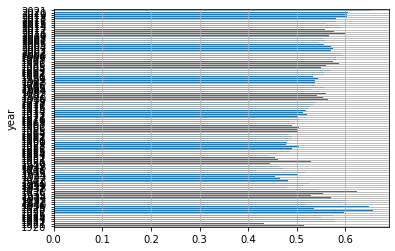

In [ ]:
df.groupby(by='year')['danceability'].mean().plot.barh(grid=True)

In order to make the examination more accurate, transactions can be made between 1990-2000 and 2000-2010.

In [ ]:
df1= df[df["year"] >= 1990]  # selection by boolean arrays
df2= df1[df1["year"] < 2000]
df3= df[df["year"] >= 2000]
df4= df3[df3["year"] < 2010]
df2.year.value_counts().to_dict()

{1990: 2008,
 1991: 2121,
 1992: 2008,
 1993: 2014,
 1994: 2019,
 1995: 2001,
 1996: 2021,
 1997: 2027,
 1998: 2034,
 1999: 2075}

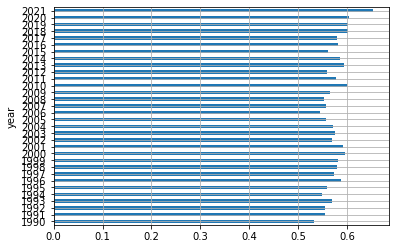

In [ ]:
#Change in the average value of danceability over a 20-year period
df1.groupby(by = 'year')['danceability'].mean().plot.barh(grid=True)

In [ ]:
df4.year.value_counts().to_dict()

{2000: 1166,
 2001: 981,
 2002: 2055,
 2003: 1264,
 2004: 1062,
 2005: 1319,
 2006: 1359,
 2007: 1334,
 2008: 1681,
 2009: 1561}

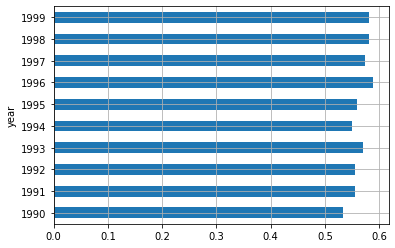

In [ ]:
df2.groupby(by = 'year')['danceability'].mean().plot.barh(grid=True)

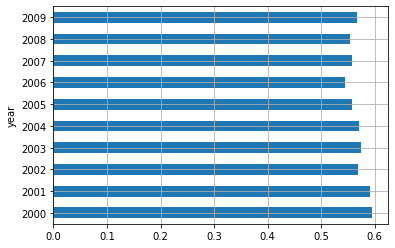

In [ ]:
df4.groupby(by = 'year')['danceability'].mean().plot.barh(grid=True)

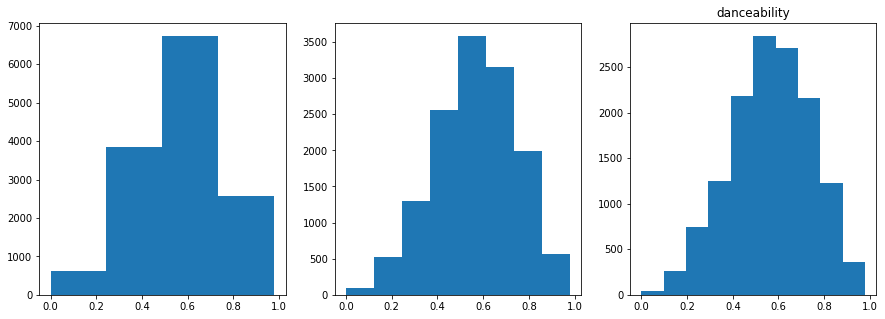

In [ ]:
data = df4['danceability'].values
_, axes = plt.subplots(1,3,figsize=(15,5))
axes[0].hist(data, bins=4)
axes[1].hist(data, bins=8)
axes[2].hist(data, bins=10)
plt.title("danceability") 

plt.show()

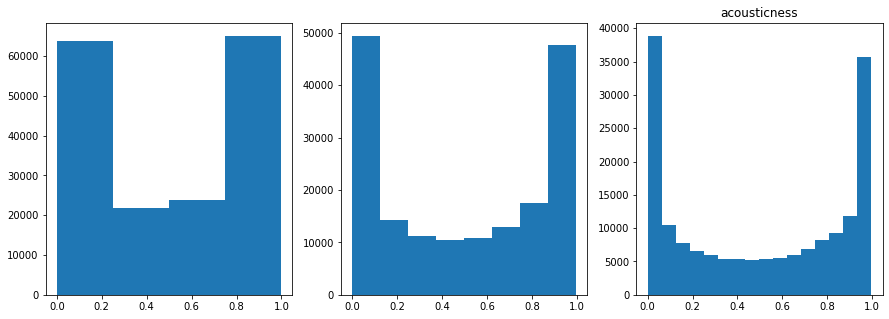

In [ ]:
data = df['acousticness'].values
_, axes = plt.subplots(1,3,figsize=(15,5))
axes[0].hist(data, bins=4)
axes[1].hist(data, bins=8)
axes[2].hist(data, bins=16)
plt.title("acousticness") 

plt.show()

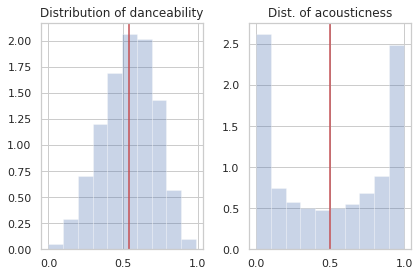

In [ ]:
fig, axes = plt.subplots(1, 2)
axes[0].set_title("Distribution of danceability")
axes[0].hist(df['danceability'], alpha=0.3, density=True)
axes[0].axvline(df['danceability'].mean(), 0, 1, c="r")

axes[1].set_title("Dist. of acousticness")
axes[1].hist(df['acousticness'], alpha=0.3, density=True)
axes[1].axvline(df['acousticness'].mean(), 0, 1, c="r")

plt.tight_layout()
plt.show()

 In all 100 years of data, it can be observed that danceability of the tracks are distributed normally, while acoustşcness of the tracks U shaped distributed.

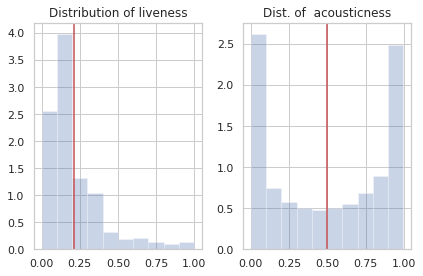

In [ ]:
fig, axes = plt.subplots(1, 2)
axes[0].set_title("Distribution of liveness")
axes[0].hist(df['liveness'], alpha=0.3, density=True)
axes[0].axvline(df['liveness'].mean(), 0, 1, c="r")
axes[1].set_title("Dist. of  acousticness")
axes[1].hist(df['acousticness'], alpha=0.3, density=True)
axes[1].axvline(df['acousticness'].mean(), 0, 1, c="r")

plt.tight_layout()
plt.show()

Although acousticness of the data U shaped distributed, the distribution of liveness of the data seems negatively skewed.  In that case, it can be argued that tracks with lower values of liveness in our dataset are causing the mean value of liveness to be lower than the majority of tracks reviews.

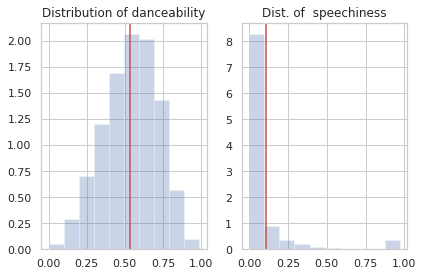

In [ ]:
fig, axes = plt.subplots(1, 2)
axes[0].set_title("Distribution of danceability")
axes[0].hist(df['danceability'], alpha=0.3, density=True)
axes[0].axvline(df['danceability'].mean(), 0, 1, c="r")
axes[1].set_title("Dist. of  speechiness")
axes[1].hist(df['speechiness'], alpha=0.3, density=True)
axes[1].axvline(df['speechiness'].mean(), 0, 1, c="r")

plt.tight_layout()
plt.show()

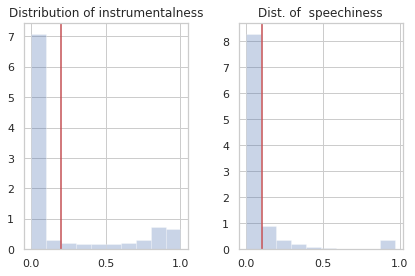

In [ ]:
fig, axes = plt.subplots(1, 2)
axes[0].set_title("Distribution of instrumentalness")
axes[0].hist(df['instrumentalness'], alpha=0.3, density=True)
axes[0].axvline(df['instrumentalness'].mean(), 0, 1, c="r")

axes[1].set_title("Dist. of  speechiness")
axes[1].hist(df['speechiness'], alpha=0.3, density=True)
axes[1].axvline(df['speechiness'].mean(), 0, 1, c="r")

plt.tight_layout()
plt.show()

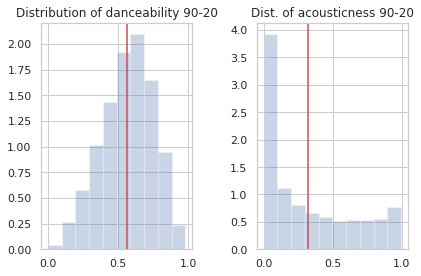

In [ ]:
fig, axes = plt.subplots(1, 2)
axes[0].set_title("Distribution of danceability 90-20")
axes[0].hist(df2['danceability'], alpha=0.3, density=True)
axes[0].axvline(df2['danceability'].mean(), 0, 1, c="r")

axes[1].set_title("Dist. of acousticness 90-20")
axes[1].hist(df2['acousticness'], alpha=0.3, density=True)
axes[1].axvline(df2['acousticness'].mean(), 0, 1, c="r")

plt.tight_layout()
plt.show()

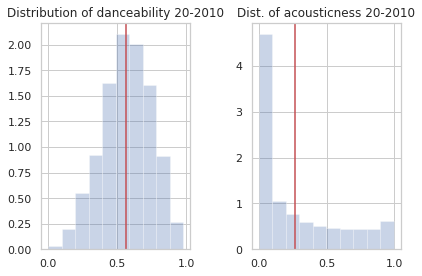

In [ ]:
fig, axes = plt.subplots(1, 2)
axes[0].set_title("Distribution of danceability 20-2010")
axes[0].hist(df4['danceability'], alpha=0.3, density=True)
axes[0].axvline(df4['danceability'].mean(), 0, 1, c="r")

axes[1].set_title("Dist. of acousticness 20-2010")
axes[1].hist(df4['acousticness'], alpha=0.3, density=True)
axes[1].axvline(df4['acousticness'].mean(), 0, 1, c="r")

plt.tight_layout()
plt.show()

#Analysis of the most popular artists and songs




### Top 15 artist according to their popularity *index*



In [ ]:
most15PopularArtist= df_artist.sort_values(by=['popularity']).tail(15)
most15PopularArtist

,artists,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,count
4969,Chencho Corleone,0.152667,0.733,250428.333333,0.763667,0.000239,0.275667,-4.232,0.0516,168.004333,0.914333,85.666667,5,0,3
27057,Surf Mesa,0.068600,0.674,176547.000000,0.774000,0.001880,0.393000,-7.567,0.0892,112.050000,0.330000,86.000000,11,0,1
13316,Jay Wheeler,0.186500,0.843,300801.500000,0.675500,0.000458,0.119500,-5.074,0.1161,90.010000,0.720500,86.000000,11,1,2
21024,Nuka,0.105000,0.738,192921.000000,0.850000,0.000000,0.230000,-3.049,0.0642,98.013000,0.865000,86.000000,8,1,2
8677,Emilee,0.068600,0.674,176547.000000,0.774000,0.001880,0.393000,-7.567,0.0892,112.050000,0.330000,86.000000,11,0,2
13565,Jerry Di,0.819000,0.854,197587.000000,0.525000,0.000000,0.146000,-4.426,0.2140,97.054000,0.630000,86.000000,1,1,2
6259,DJ Nelson,0.186500,0.843,300801.500000,0.675500,0.000458,0.119500,-5.074,0.1161,90.010000,0.720500,86.000000,11,1,2
14918,KIDDO,0.286000,0.504,190218.000000,0.760000,0.000000,0.151000,-4.246,0.0426,183.933000,0.640000,87.000000,4,1,2
17173,Los Legendarios,0.310000,0.823,213314.000000,0.821000,0.000004,0.143000,-3.402,0.1660,99.999000,0.791000,89.000000,8,0,2
23922,Ritt Momney,0.056300,0.399,210463.000000,0.491000,0.000890,0.110000,-10.778,0.0538,91.066000,0.151000,89.000000,6,0,2


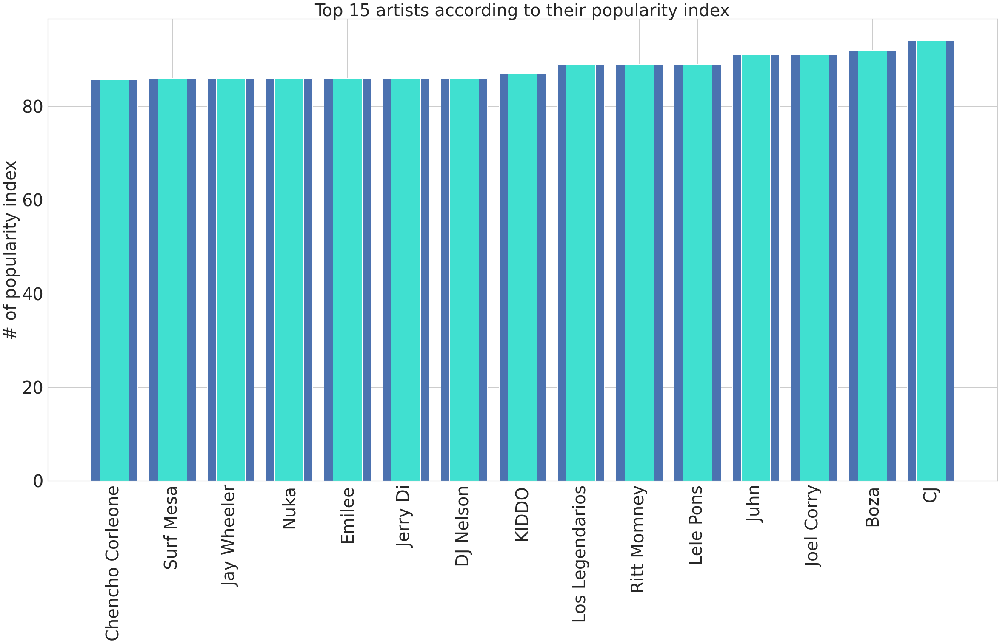

In [ ]:
most15PopularArtist.sort_values(by=['popularity'])
plt.figure(1,figsize=(40,20))
label=most15PopularArtist['artists']
y=most15PopularArtist['popularity']
plt.bar(label,y)
plt.title("Top 15 artists according to their popularity index",fontsize=40)
plt.ylabel("# of popularity index",fontsize=40)
plt.xticks(range(len(label)),label,fontsize=40,rotation=90)
plt.bar(label,y,width = 0.5, color='turquoise')
plt.yticks(fontsize=40)
plt.show()


###Top 15 songs according to their popularity index



In [ ]:
most15PopularSongs= df.sort_values(by=['popularity']).tail(15)
most15PopularSongs

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year
19908,0.8640,"['Justin Bieber', 'benny blanco']",0.631,149297,0.239,1,4y4spB9m0Q6026KfkAvy9Q,0.000000,11,0.1160,-7.071,0,Lonely (with benny blanco),92,2020-10-16,0.0398,79.859,0.0927,2020
19880,0.0194,"['Cardi B', 'Megan Thee Stallion']",0.935,187541,0.454,1,4Oun2ylbjFKMPTiaSbbCih,0.000000,1,0.0824,-7.509,1,WAP (feat. Megan Thee Stallion),92,2020-08-07,0.3750,133.073,0.3570,2020
19884,0.1200,['Lil Nas X'],0.810,154998,0.511,1,6zFMeegAMYQo0mt8rXtrli,0.000000,5,0.0832,-6.924,0,HOLIDAY,92,2020-11-13,0.1640,151.947,0.8370,2020
19900,0.7860,['Tate McRae'],0.642,169266,0.374,0,45bE4HXI0AwGZXfZtMp8JR,0.000000,4,0.0906,-9.386,1,you broke me first,93,2020-04-17,0.0545,124.099,0.0799,2020
19878,0.6500,['Pop Smoke'],0.709,160000,0.548,1,1tkg4EHVoqnhR6iFEXb60y,0.000002,10,0.1330,-8.493,1,What You Know Bout Love,93,2020-07-03,0.3530,83.995,0.5430,2020
19876,0.2180,['Billie Eilish'],0.889,174321,0.340,0,54bFM56PmE4YLRnqpW6Tha,0.130000,11,0.0550,-7.773,0,Therefore I Am,94,2020-11-12,0.0697,94.009,0.7160,2020
19872,0.2130,['The Kid LAROI'],0.662,161385,0.413,1,27OeeYzk6klgBh83TSvGMA,0.000000,0,0.1340,-7.357,1,WITHOUT YOU,94,2020-11-06,0.0299,93.005,0.4670,2020
19868,0.2370,['Ariana Grande'],0.830,173711,0.585,1,6Im9k8u9iIzKMrmV7BWtlF,0.000000,0,0.2480,-6.476,1,34+35,94,2020-10-30,0.0940,109.978,0.4850,2020
19928,0.0303,"['Bad Bunny', 'ROSALÍA']",0.856,203201,0.618,0,2XIc1pqjXV3Cr2BQUGNBck,0.000000,7,0.0866,-4.892,1,LA NOCHE DE ANOCHE,94,2020-11-27,0.2860,81.993,0.3910,2020
19870,0.1900,['CJ'],0.711,123429,0.598,1,5vGLcdRuSbUhD8ScwsGSdA,0.000000,3,0.1500,-7.621,0,Whoopty,94,2020-08-20,0.1820,140.175,0.7370,2020


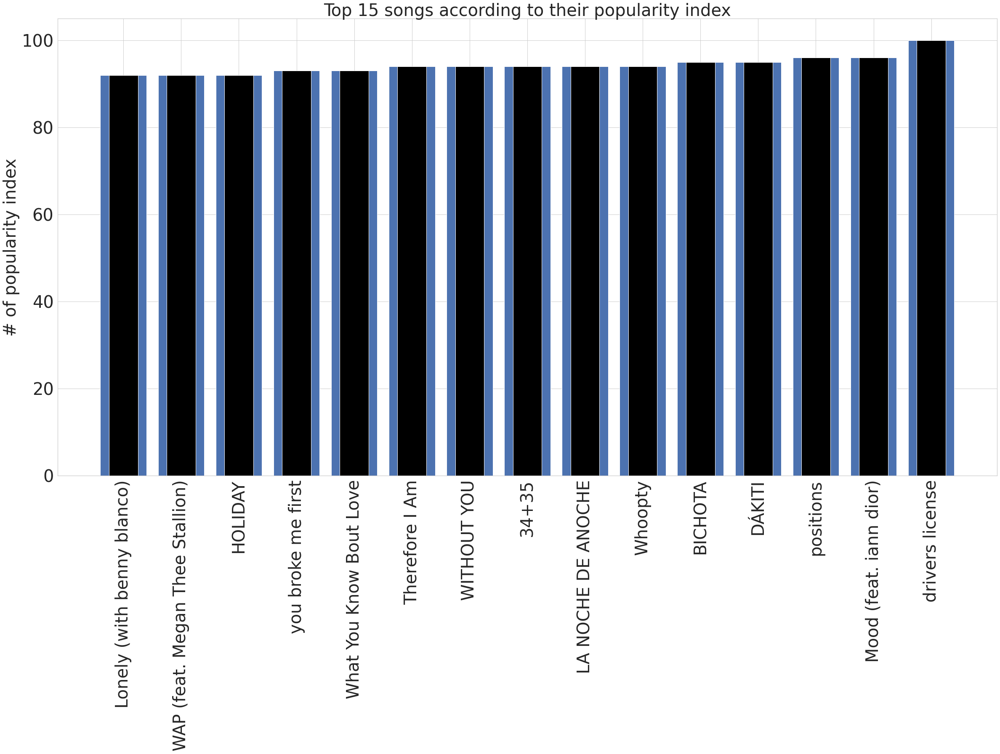

In [ ]:
most15PopularSongs.sort_values(by=['popularity'])
plt.figure(1,figsize=(40,20))
label=most15PopularSongs['name']
y=most15PopularSongs['popularity']
plt.bar(label,y)
plt.title("Top 15 songs according to their popularity index",fontsize=40)
plt.ylabel("# of popularity index",fontsize=40)
plt.xticks(range(len(label)),label,fontsize=40,rotation=90)
plt.bar(label,y,width = 0.5, color='black')
plt.yticks(fontsize=40)
plt.show()

### Top 15 artist according to their songs count

In [ ]:
mostCountedSongs=df_artist.sort_values(by=['count']).tail(15)
mostCountedSongs

,artists,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key,mode,count
14003,Johann Sebastian Bach,0.951933,0.343582,211534.766423,0.201234,0.744885,0.171455,-20.567836,0.048362,105.011306,0.547812,13.188738,7,1,959
8637,Elvis Presley,0.745000,0.492142,157529.483549,0.420761,0.054033,0.241288,-12.999656,0.057147,111.784354,0.611982,34.312064,0,1,1003
14226,Johnny Cash,0.689845,0.615282,164585.148957,0.439587,0.015276,0.242379,-11.736462,0.095565,114.091300,0.664498,26.774578,10,1,1007
10064,Frédéric Chopin,0.990084,0.339743,252552.787759,0.106923,0.878188,0.153942,-22.594728,0.042360,90.934017,0.205012,5.351431,1,1,1013
20593,New York Philharmonic,0.899613,0.279961,409822.971981,0.198287,0.619549,0.209810,-18.744184,0.045857,104.530953,0.217481,7.418357,7,1,1035
3185,Billie Holiday,0.908297,0.572370,185551.636280,0.202495,0.013311,0.217983,-13.164125,0.057774,109.953923,0.499460,16.169429,5,1,1086
31127,Wiener Philharmoniker,0.913729,0.370016,325624.348254,0.268914,0.576856,0.494689,-18.990380,0.119031,108.061226,0.329642,12.102059,2,1,1117
2084,Arturo Toscanini,0.919626,0.316362,312564.867647,0.203026,0.470814,0.281935,-17.158358,0.058587,102.495139,0.281227,0.238754,0,1,1156
30780,Vladimir Horowitz,0.990102,0.343255,264516.997504,0.118559,0.879825,0.181991,-23.184564,0.043264,94.879761,0.226215,3.644759,1,1,1202
12375,Ignacio Corsini,0.985111,0.545917,154597.725962,0.188285,0.423542,0.182516,-20.843069,0.121192,106.669327,0.638505,0.036859,5,1,1248


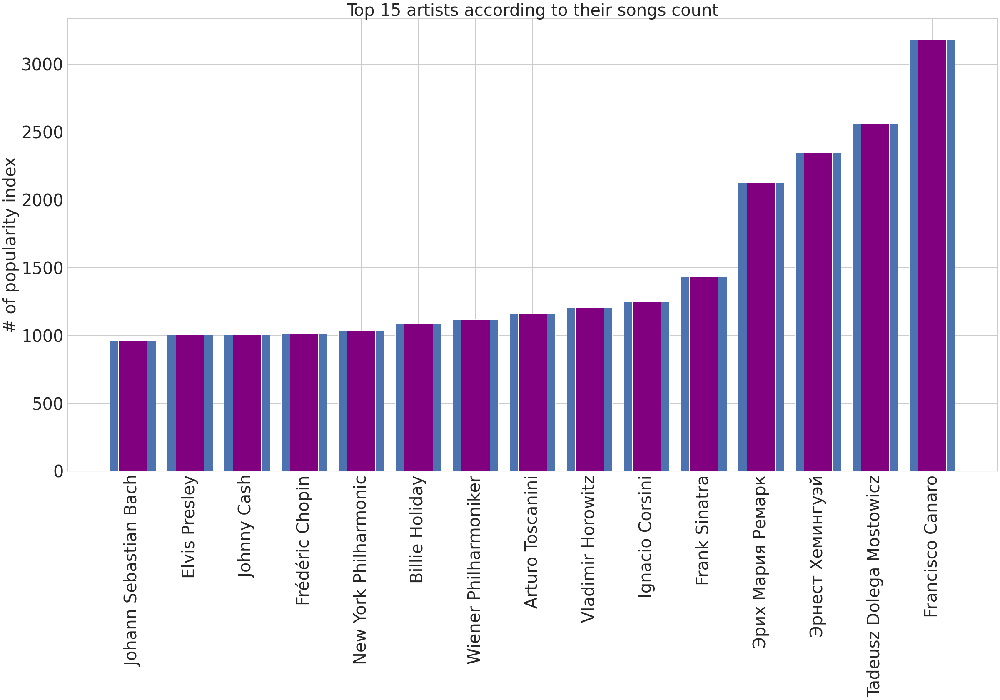

In [ ]:
mostCountedSongs.sort_values(by=['count'])
plt.figure(1,figsize=(40,20))
label=mostCountedSongs['artists']
y=mostCountedSongs['count']
plt.bar(label,y)
plt.title("Top 15 artists according to their songs count",fontsize=40)
plt.ylabel("# of popularity index",fontsize=40)
plt.xticks(range(len(label)),label,fontsize=40,rotation=90)
plt.bar(label,y,width = 0.5, color='purple')
plt.yticks(fontsize=40)
plt.show()

#Temporal analysis of features according to different genres

A new appropriate data frame was created by mapping the year informations and genre informations needed to perform temporal analysis on genres, datacsv and data_w_genres datasets to each other through artists.

In [ ]:
import seaborn as sns
%matplotlib inline
from ast import literal_eval
artist = df.copy()
artist['artists'] = artist['artists'].map(lambda x: literal_eval(x))
artist['artists'] = artist['artists'].map(lambda x: x[0])
df_w_genres=df_w_genres[['artists','genres']]
result = pd.merge(artist ,df_w_genres ,on="artists")
result = result.sort_values(by=['year'])
result.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,genres
0,0.991,Mamie Smith,0.5980,168333,0.2240,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.379,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.6340,1920,"['harlem renaissance', 'traditional blues']"
2482,0.761,Gustavo Obligado,0.0735,281500,0.0888,1,2PCiNuXDp5StM7fEmSLhPq,0.970000,5,0.105,-27.907,0,Sin Safari (Live),0,1920,0.0446,80.226,0.0224,1920,[]
2481,0.646,Gustavo Obligado,0.4390,290000,0.3200,1,24pfUpoUsOo4XyPaHgPDBu,0.873000,1,0.647,-27.838,1,Eurodance (Live) [feat. Ariel Flores & Sam Nacht],0,1920,0.0675,108.790,0.6010,1920,[]
2480,0.365,Gustavo Obligado,0.5650,128500,0.2550,1,14YYUaft0fQCYn7IqL4FYV,0.000287,10,0.321,-30.644,1,Indios Cheroqui (Live) [feat. Ariel Flores & S...,0,1920,0.0480,94.519,0.7250,1920,[]
2470,0.964,Marika Papagkika,0.2300,231387,0.3960,0,4qHVjzBNc4CB2jM5uizth7,0.074200,5,0.274,-8.578,1,Ntourou Ntourou,0,1920-01-01,0.0363,69.893,0.7040,1920,[]


After merging, it was observed that there was no genre information for some artists. These are missing value for the analysis that needs to be done. For this reason, it is necessary to remove it from the data so that the analysis can be realized.

In [ ]:
result=result[result.astype(str)['genres'] != '[]']
result.head()

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,genres
0,0.99100,Mamie Smith,0.598,168333,0.224,0,0cS0A1fUEUd1EW3FcF8AEI,0.000522,5,0.3790,-12.628,0,Keep A Song In Your Soul,12,1920,0.0936,149.976,0.634,1920,"['harlem renaissance', 'traditional blues']"
2458,0.97900,Esther Lekain,0.583,144440,0.250,0,3e83ZnSInKBnjlFHO5IogK,0.000000,2,0.1580,-13.813,1,Ah Si Vous Voulez D'l'amour,0,1920,0.0800,119.487,0.707,1920,['vintage chanson']
2457,0.98600,Esther Lekain,0.641,179160,0.169,0,0ojvOshbJWnvrcPRgLVtg2,0.000000,7,0.0706,-13.139,1,Ca N'vaut Pas L'amour,0,1920,0.1300,116.249,0.687,1920,['vintage chanson']
122243,0.00316,The Pixels,0.417,108000,0.453,0,0cmhlfd5JitfzZMer2aTJN,0.946000,2,0.1740,-7.019,0,"Aero the Acrobat Title Screen (From ""Aero the ...",0,1920-01-04,0.0314,142.117,0.470,1920,['romanian rock']
122244,0.97600,The Pixels,0.294,149500,0.444,0,1KdknRJ03Ny7WjyrOwENGo,0.894000,5,0.1310,-5.248,1,"Theme from Space Harrier II (From ""Space Harri...",0,1920-01-04,0.0352,113.080,0.127,1920,['romanian rock']



The list object has been converted to string to allow parent generations to be read and processed in sub-generes. In addition, rows containing multiple pieces of information about genres. The reason for this is that if the specific properties of the genres are wanted to be compared, it is appropriate to remove the rows whose properties are all the same.



In [ ]:
result['genres'].str
df5=result.copy()
df5['genres'] = df5['genres'].map(lambda x: literal_eval(x))
df5['genres'] = df5['genres'].map(lambda x: x[0])
df5['genres'].str;

In [ ]:
df5.genres.value_counts().to_dict()

{'adult standards': 16410,
 'album rock': 12082,
 'classical': 8971,
 'bebop': 3979,
 'dance pop': 3976,
 'alternative rock': 3225,
 'alternative metal': 3197,
 'tango': 2877,
 'classic bollywood': 2384,
 'classic rock': 2351,
 'contemporary country': 2012,
 'classic soul': 1922,
 'latin': 1764,
 'brill building pop': 1641,
 'art rock': 1629,
 'country': 1552,
 'baroque': 1325,
 'dance rock': 1243,
 'corrido': 1060,
 'blues': 978,
 'american folk revival': 963,
 'bolero': 960,
 'disco': 914,
 'acoustic blues': 911,
 'classic country pop': 890,
 'blues rock': 838,
 'classic soundtrack': 825,
 'funk': 805,
 'grupera': 799,
 'arkansas country': 776,
 'big band': 733,
 'alternative hip hop': 728,
 'east coast hip hop': 724,
 'atl hip hop': 689,
 'alternative country': 677,
 'avant-garde jazz': 666,
 'baroque pop': 630,
 'mariachi': 622,
 'broadway': 617,
 'banda': 593,
 'boy band': 577,
 'hip hop': 570,
 'progressive house': 568,
 'rebetiko': 562,
 'beatlesque': 558,
 'american modern clas

###Rock as parent genre

In [ ]:
dataOfRock = df5[df5['genres'].str.contains("rock")] # rock as parent genre
dataOfRock.head() 

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,genres
122243,0.00316,The Pixels,0.417,108000,0.453,0,0cmhlfd5JitfzZMer2aTJN,0.9460,2,0.174,-7.019,0,"Aero the Acrobat Title Screen (From ""Aero the ...",0,1920-01-04,0.0314,142.117,0.470,1920,romanian rock
122244,0.97600,The Pixels,0.294,149500,0.444,0,1KdknRJ03Ny7WjyrOwENGo,0.8940,5,0.131,-5.248,1,"Theme from Space Harrier II (From ""Space Harri...",0,1920-01-04,0.0352,113.080,0.127,1920,romanian rock
122245,0.11400,The Pixels,0.525,22922,0.568,0,2qMnMGB9QtigWHUetCjeXE,0.0922,0,0.257,-4.788,1,"Sonic the Hedgehog 2 Intro Theme (From ""Sonic ...",0,1920-01-04,0.0888,150.142,0.766,1920,romanian rock
122246,0.10600,The Pixels,0.643,84312,0.758,0,3pyszFWfJTEpZo90i75Bvx,0.9430,0,0.257,-9.279,1,"Intro Theme (From ""Aero the Acrobat 2"") [Genes...",0,1920-01-04,0.0418,120.064,0.972,1920,romanian rock
122247,0.01310,The Pixels,0.674,106500,0.662,0,4IYIlWb2o8ifdUZeNNjQx8,0.1780,2,0.328,-10.648,1,Earthworm Jim [Genesis Mix],2,1920-01-04,0.0695,165.993,0.531,1920,romanian rock


In [ ]:
dataOfRock.genres.value_counts().to_dict()

{'acid rock': 489,
 'acoustic rock': 11,
 'action rock': 4,
 'african rock': 4,
 'album rock': 12082,
 'alternative pop rock': 16,
 'alternative rock': 3225,
 'alternative roots rock': 7,
 'american post-rock': 14,
 'anadolu rock': 6,
 'anime rock': 17,
 'argentine rock': 195,
 'art rock': 1629,
 'atmospheric post-rock': 1,
 'australian alternative rock': 68,
 'australian rock': 79,
 'blues rock': 838,
 'boston rock': 27,
 'brazilian rock': 41,
 'british alternative rock': 9,
 'british indie rock': 3,
 'british post-rock': 5,
 'cambodian rock': 5,
 'canadian post-rock': 5,
 'canadian rock': 10,
 'canadian rockabilly': 1,
 'celtic rock': 38,
 'chilean rock': 29,
 'christian alternative rock': 26,
 'christian rock': 18,
 'classic canadian rock': 19,
 'classic garage rock': 108,
 'classic j-rock': 66,
 'classic psychedelic rock': 5,
 'classic rock': 2351,
 'classic russian rock': 25,
 'colombian rock': 7,
 'comedy rock': 53,
 'cosmic post-rock': 1,
 'country rock': 394,
 'crack rock stead

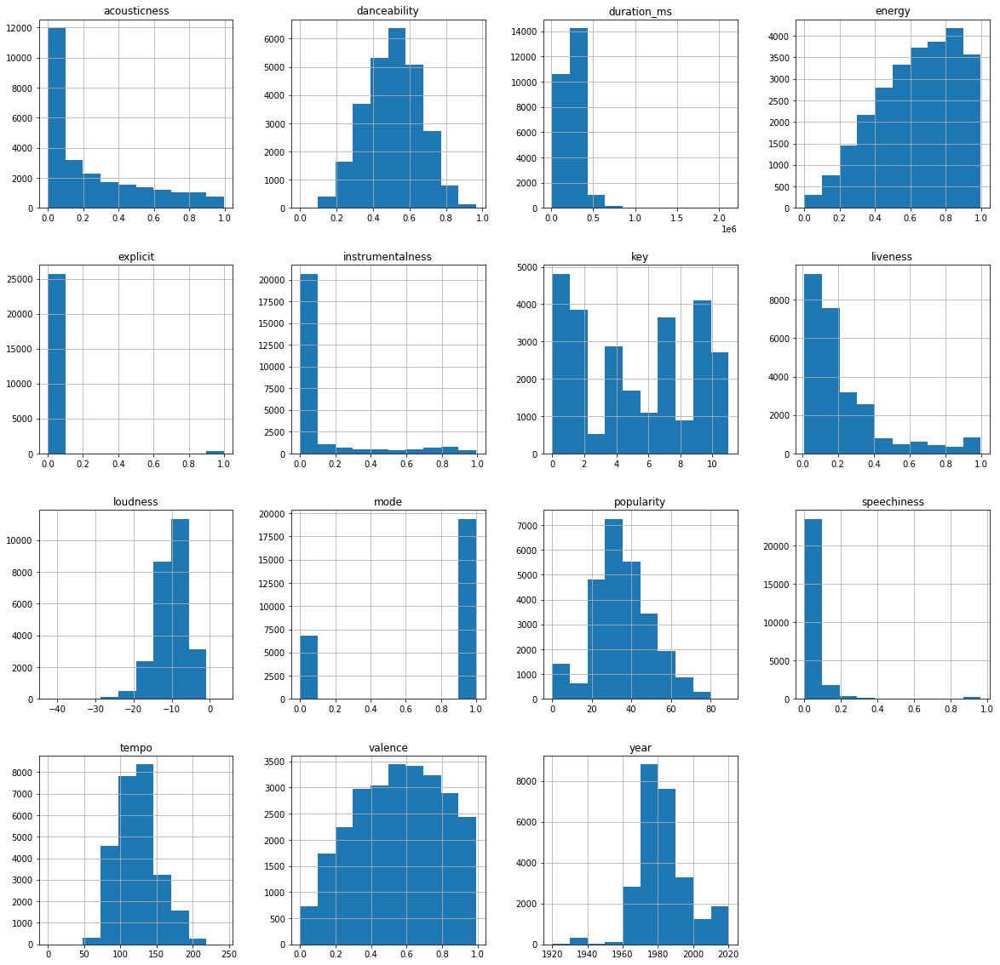

In [ ]:
dataOfRock.hist(figsize=(20,20))
plt.show()

<Figure size 2880x1440 with 0 Axes>

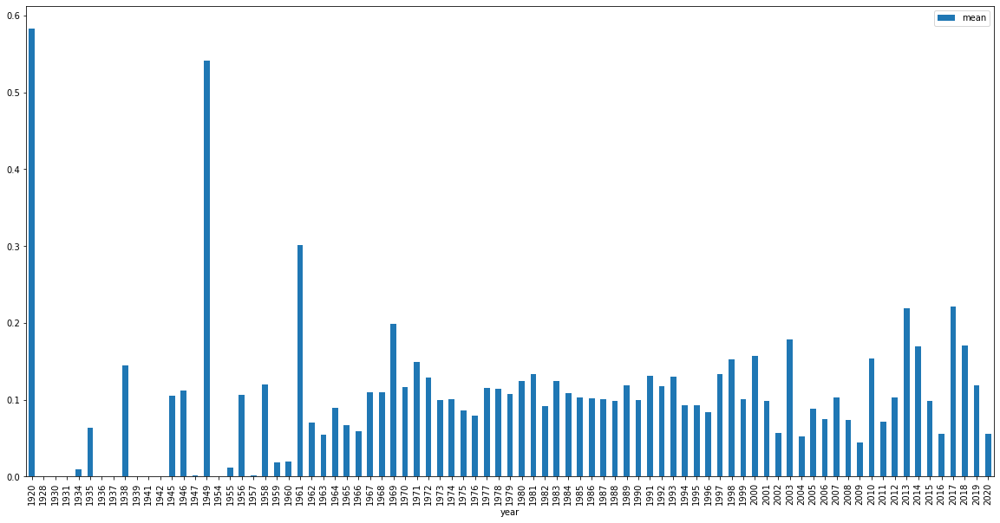

In [ ]:
instrumentalnessrock = dataOfRock.groupby('year')['instrumentalness'].mean()
instrumentalnessrock = instrumentalnessrock.reset_index()
instrumentalnessrock.columns = ['year', 'mean']
plt.figure(1,figsize=(40,20))
label=instrumentalnessrock['year']
y=instrumentalnessrock['mean']
ax = instrumentalnessrock.plot.bar(x='year', y='mean', figsize=(20,10))

As can be seen above, the years in which the instrumentalness of the rock parent genre is dramatically high at 1920 and then 1949, while the value of this property usually varies between 0 and 0.3.

<Figure size 2880x1440 with 0 Axes>

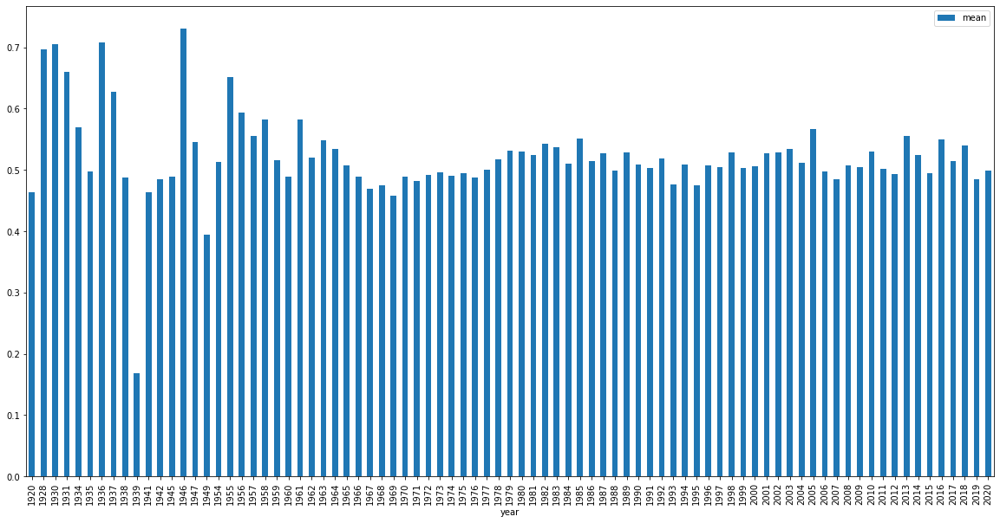

In [ ]:
danceability = dataOfRock.groupby('year')['danceability'].mean()
danceability = danceability.reset_index()
danceability.columns = ['year', 'mean']
plt.figure(1,figsize=(40,20))
label=danceability['year']
y=danceability['mean']
ax = danceability.plot.bar(x='year', y='mean', figsize=(20,10))

From 1961 on the general trend, it can be said that the danceability of the rock genre has fallen. However, the most notable outlier in the chart above is the year 1939 with the lowest danceability value.

<Figure size 2880x1440 with 0 Axes>

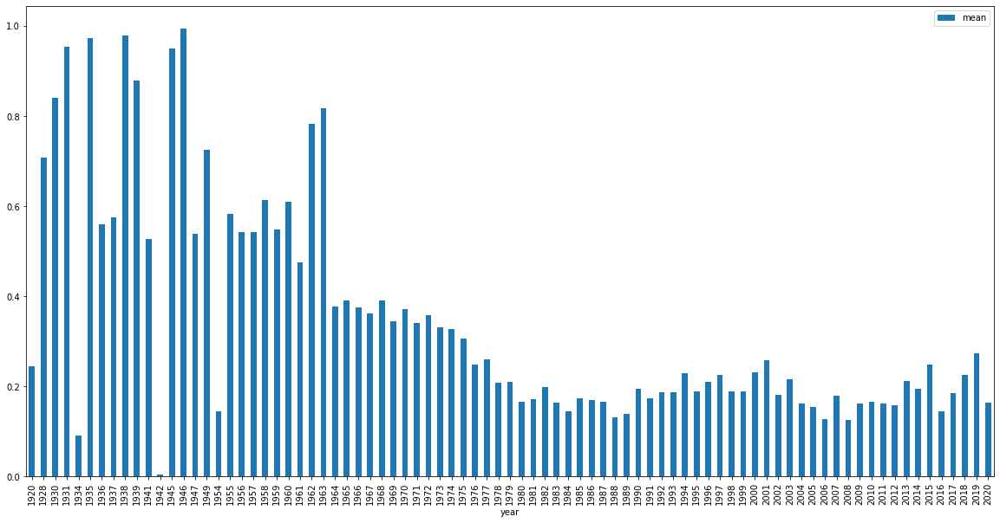

In [ ]:
acousticness = dataOfRock.groupby('year')['acousticness'].mean()
acousticness = acousticness.reset_index()
acousticness.columns = ['year', 'mean']
plt.figure(1,figsize=(40,20))
label=acousticness['year']
y=acousticness['mean']
ax = acousticness.plot.bar(x='year', y='mean', figsize=(20,10))

Although the change in acousticness has been quite fluctuating over the years, it is possible to say that it has fluctuated in a narrower and lower range since 1964.

Text(0.5, 0, 'Year')

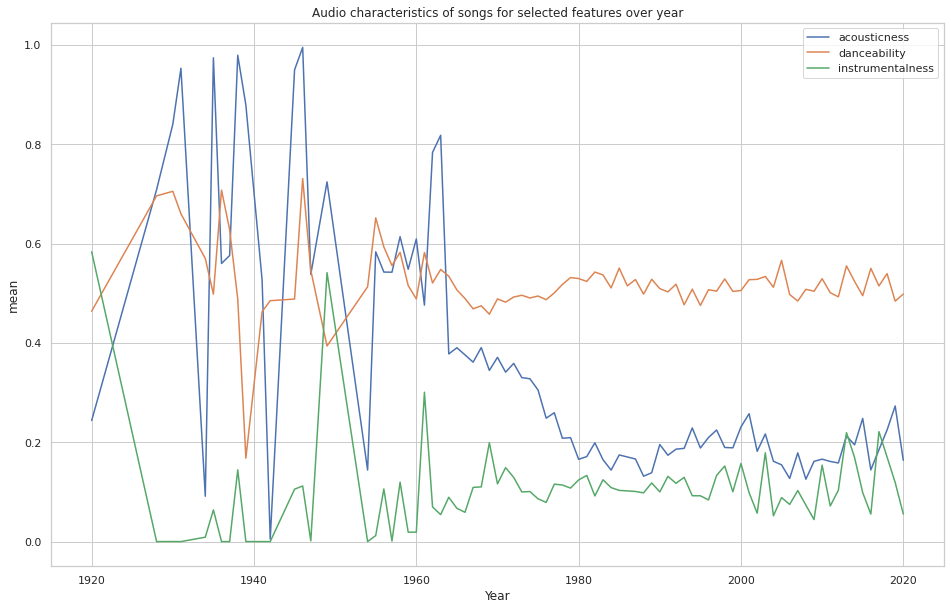

In [ ]:
plt.figure(figsize=(16, 10))
sns.set(style="whitegrid")
columns = ["acousticness","danceability","instrumentalness"]
for col in columns:
    x = dataOfRock.groupby("year")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col)
ax.set_title('Audio characteristics of songs for selected features over year')
ax.set_ylabel('mean')
ax.set_xlabel('Year')

The temporal changes of the characteristics of the species studied individually above are shown immediately above with a single graph. Thanks to this chart, it can be said that while the rock parent genre did not show stable acoustics, danceability or instrumentality before the 1960s, it has fluctuated in a more specific value range since the 1960s.

Text(0.5, 0, 'Year')

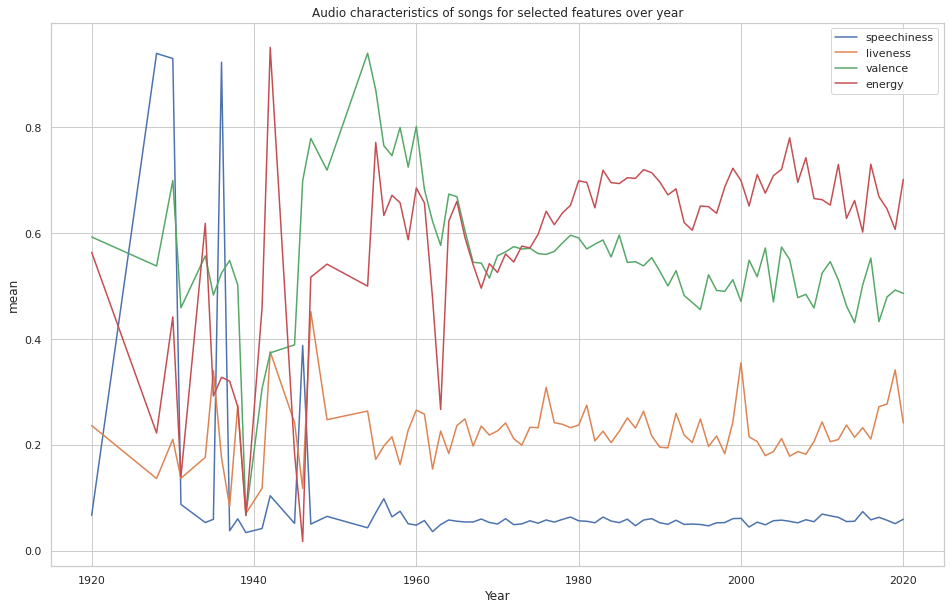

In [ ]:
plt.figure(figsize=(16, 10))
sns.set(style="whitegrid")
columns = ["speechiness","liveness","valence","energy"]
for col in columns:
    x = dataOfRock.groupby("year")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col)
ax.set_title('Audio characteristics of songs for selected features over year')
ax.set_ylabel('mean')
ax.set_xlabel('Year')

While it has been observed that the rock parent genre has remained almost stable at a fairly low value since the 1960s, it is possible to say that all four characteristics have fluctuated in much more specific narrow ranges since the 1960s.

###Rap as parent genre

In [ ]:
dataOfRap = df5[df5['genres'].str.contains("rap")]
dataOfRap

,acousticness,artists,danceability,duration_ms,energy,explicit,id,instrumentalness,key,liveness,loudness,mode,name,popularity,release_date,speechiness,tempo,valence,year,genres
2386,0.496,ST,0.712,230348,0.402,1,6l9cb1v91Jy4RfQpfMYCxb,0.000002,0,0.0796,-9.326,0,Magaluf,0,1920,0.1610,142.003,0.4380,1920,houston rap
2385,0.280,ST,0.843,295915,0.481,1,6fX314XWn81D16U4WSd5My,0.000000,6,0.1100,-8.444,0,Bébé,0,1920,0.2610,100.011,0.4100,1920,houston rap
2384,0.535,ST,0.623,264568,0.650,1,6Gpd4oUZL5jUpPR3mAirDc,0.000000,9,0.1090,-7.933,0,Mago,0,1920,0.3200,196.004,0.2620,1920,houston rap
2383,0.891,ST,0.410,181969,0.296,1,5RgQ7t5uimI5St2H3CV9pb,0.000005,0,0.0910,-13.879,0,Moyenne d'âge,0,1920,0.0386,127.946,0.0625,1920,houston rap
2382,0.572,ST,0.703,142315,0.403,1,4jyti77pNe75LOwLVSYHb4,0.000023,2,0.1120,-9.860,0,De Niro,0,1920,0.0786,134.946,0.3280,1920,houston rap
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
121794,0.168,Internet Money,0.832,181496,0.549,1,0NElwGxsJIPavD1YPqOHMo,0.000000,1,0.1100,-8.259,0,Lemonade - Remix,0,2021-01-22,0.0602,140.045,0.3840,2021,pop rap
121795,0.168,Internet Money,0.832,181496,0.549,1,10J6vBtYM8ZcdAu4n2B823,0.000000,1,0.1100,-8.259,0,Lemonade - Remix,0,2021-01-22,0.0602,140.045,0.3840,2021,pop rap
121796,0.168,Internet Money,0.832,181496,0.549,1,5fob3oEJujrgYNxnghMUMA,0.000000,1,0.1100,-8.259,0,Lemonade - Remix,0,2021-01-22,0.0602,140.045,0.3840,2021,pop rap
121797,0.168,Internet Money,0.832,181496,0.549,1,6UuQTwQBUrZ24xhiorj0c3,0.000000,1,0.1100,-8.259,0,Lemonade - Remix,2,2021-01-22,0.0602,140.045,0.3840,2021,pop rap


In [ ]:
dataOfRap.genres.value_counts().to_dict()

{'alabama rap': 45,
 'atl trap': 5,
 'australian trap': 2,
 'bass trap': 26,
 'baton rouge rap': 80,
 'battle rap': 19,
 'cali rap': 182,
 'chicago rap': 312,
 'chicano rap': 153,
 'comedy rap': 19,
 'country rap': 93,
 'dark trap': 109,
 'deep southern trap': 5,
 'detroit trap': 4,
 'dfw rap': 68,
 'dirty south rap': 183,
 'dirty texas rap': 22,
 'dmv rap': 20,
 'electronic trap': 1,
 'emo rap': 144,
 'florida rap': 34,
 'gangster rap': 165,
 'grand rapids indie': 3,
 'houston rap': 38,
 'indie pop rap': 10,
 'jazz rap': 3,
 'jazz vibraphone': 20,
 'k-rap': 14,
 'london rap': 1,
 'melodic rap': 214,
 'meme rap': 36,
 'military rap': 2,
 'new jersey rap': 10,
 'norwegian pop rap': 1,
 'nyc rap': 21,
 'ottawa rap': 2,
 'philly rap': 2,
 'pop rap': 65,
 'rap': 74,
 'rap conciencia': 4,
 'rap cristiano': 1,
 'rap dominicano': 2,
 'rap kreyol': 10,
 'rap metal': 6,
 'rap napoletano': 1,
 'rap rock': 15,
 'sad rap': 10,
 'san diego rap': 1,
 'therapy': 20,
 'trap': 14,
 'trap argentino': 1,

<Figure size 2880x1440 with 0 Axes>

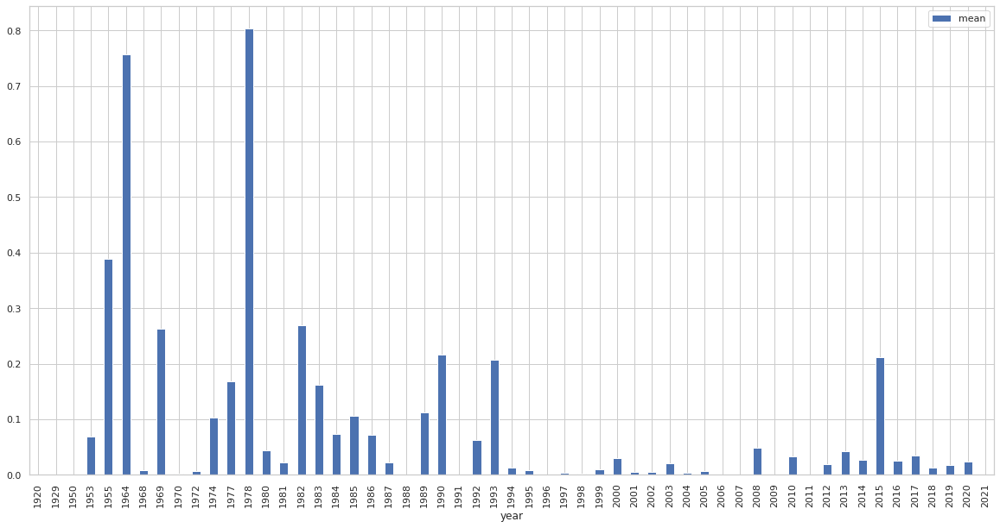

In [ ]:
instrumentalnessrap = dataOfRap.groupby('year')['instrumentalness'].mean()
instrumentalnessrap = instrumentalnessrap.reset_index()
instrumentalnessrap.columns = ['year', 'mean']
plt.figure(1,figsize=(40,20))
label=instrumentalnessrap['year']
y=instrumentalnessrap['mean']
ax = instrumentalnessrap.plot.bar(x='year', y='mean', figsize=(20,10))

As can be seen above, although the instrumentalness of the rap genre is generally quite low, it is quite high in 1978 and 1964 and 1955 respectively.

<Figure size 2880x1440 with 0 Axes>

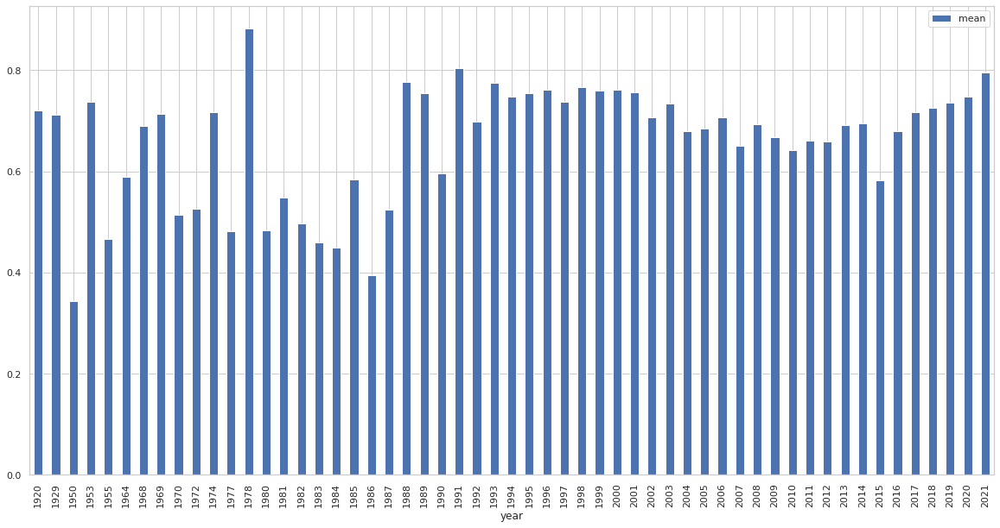

In [ ]:
danceabilityrap = dataOfRap.groupby('year')['danceability'].mean()
danceabilityrap = danceabilityrap.reset_index()
danceabilityrap.columns = ['year', 'mean']
plt.figure(1,figsize=(40,20))
label=danceabilityrap['year']
y=danceabilityrap['mean']
ax = danceabilityrap.plot.bar(x='year', y='mean', figsize=(20,10))

Although it has been seen that the rap genre has higher danceability values since 1988, in 1978 it can be observed that rap has the highest danceability value.

<Figure size 2880x1440 with 0 Axes>

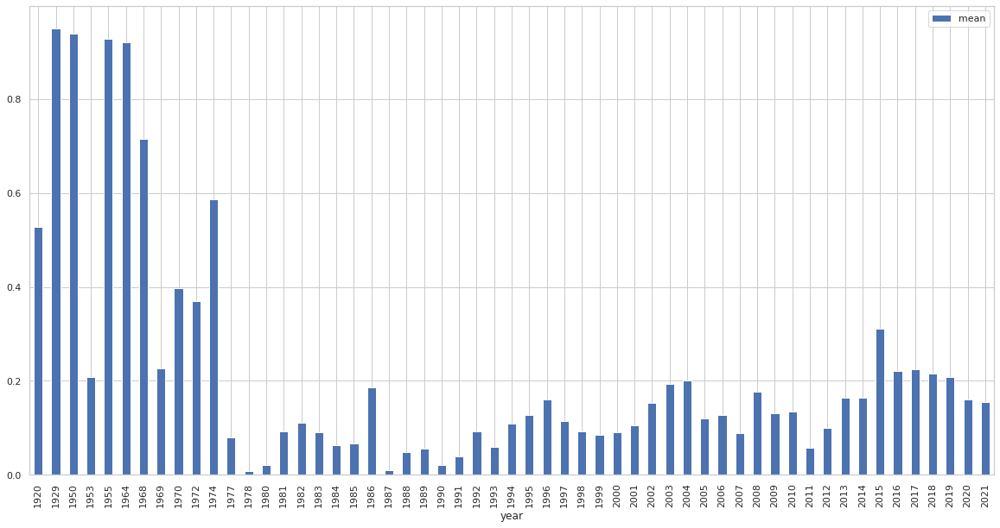

In [ ]:
acousticnessrap = dataOfRap.groupby('year')['acousticness'].mean()
acousticnessrap = acousticnessrap.reset_index()
acousticnessrap.columns = ['year', 'mean']
plt.figure(1,figsize=(40,20))
label=acousticnessrap['year']
y=acousticnessrap['mean']
ax = acousticnessrap.plot.bar(x='year', y='mean', figsize=(20,10))

It can be observed that the acoustics of the rap genre were significantly higher between 1920 and 1974 than in subsequent years.

Text(0.5, 0, 'Year')

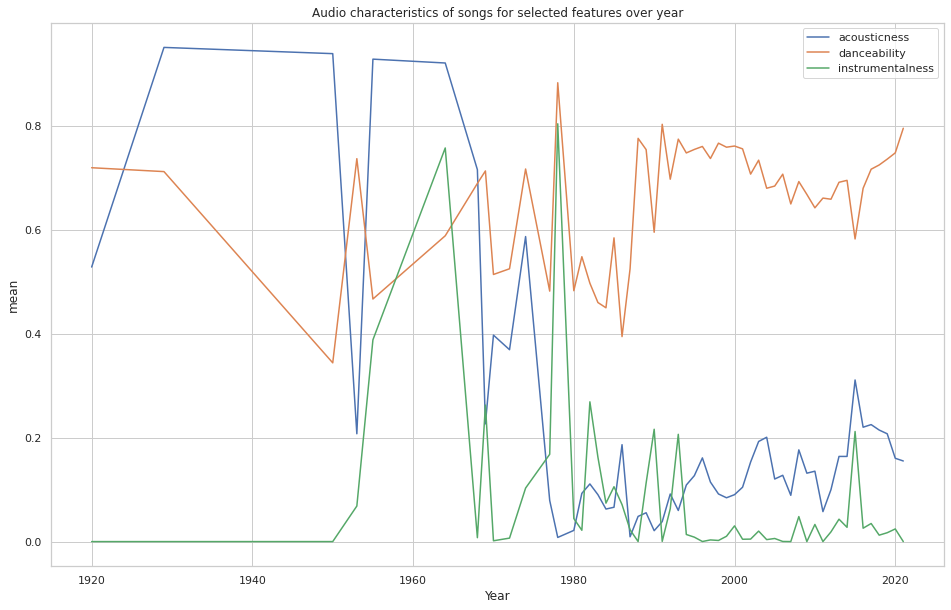

In [ ]:
plt.figure(figsize=(16, 10))
sns.set(style="whitegrid")
columns = ["acousticness","danceability","instrumentalness"]
for col in columns:
    x = dataOfRap.groupby("year")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col)
ax.set_title('Audio characteristics of songs for selected features over year')
ax.set_ylabel('mean')
ax.set_xlabel('Year')

In the chart above, the change of three characteristics of the rap genre by year can be examined in a single chart. From here, it is clear that the features before and after 1970 are in two different and opposite trends to each other. For example, its acousticness were at a fairly high value and almost stable trend before the 1970s, while it fluctuated at a fairly low value and a narrow time interval from the 1970s.

Text(0.5, 0, 'Year')

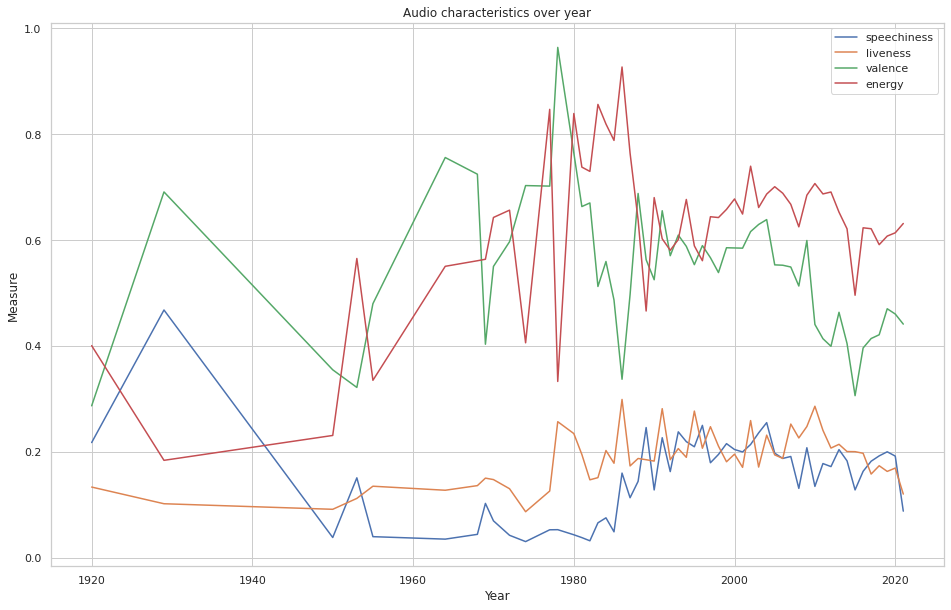

In [ ]:
plt.figure(figsize=(16, 10))
sns.set(style="whitegrid")
columns = ["speechiness","liveness","valence","energy"]
for col in columns:
    x = dataOfRap.groupby("year")[col].mean()
    ax= sns.lineplot(x=x.index,y=x,label=col)
ax.set_title('Audio characteristics over year')
ax.set_ylabel('Measure')
ax.set_xlabel('Year')

It can be observed that the rap parent genre fluctuates considerably in values and narrow ranges much closer to each other after 1985.

#Comparison of features of sub-genres over time periods


In [ ]:
justRock = dataOfRock.drop(columns=['release_date','artists','id','key','mode','name','popularity','explicit'])
justRock=justRock[justRock['year']>=1960]
justRock=justRock[justRock['year']<=2000]
justRock.head()

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,year,genres
170380,0.909,0.484,155333,0.386,0.000000,0.1430,-11.431,0.0279,106.583,0.695,1960,mexican rock-and-roll
155704,0.798,0.653,167927,0.293,0.000000,0.3350,-11.406,0.0336,113.445,0.319,1960,mexican rock-and-roll
155703,0.769,0.515,107973,0.877,0.000002,0.0937,-2.971,0.0492,93.678,0.764,1960,mexican rock-and-roll
155702,0.714,0.522,132865,0.803,0.000003,0.0821,-9.831,0.1570,181.868,0.759,1960,mexican rock-and-roll
155696,0.475,0.547,136773,0.763,0.000004,0.1350,-10.364,0.0505,166.188,0.945,1960,rockabilly


Some columns that would not be included in the comparison were removed from the data, and a new dataframe was created with only rock songs from 1960-2000.

In [ ]:
justRock=justRock.groupby(['year', 'genres']).agg({'danceability':'mean','acousticness':'mean','energy':'mean','instrumentalness':'mean','liveness':'mean','loudness':'mean','tempo':'mean','valence':'mean'})
justRock = justRock.reset_index()
justRock['genres'].value_counts()[:25]


classic rock                   40
album rock                     40
art rock                       37
blues rock                     36
country rock                   34
alternative rock               32
dance rock                     27
argentine rock                 25
glam rock                      23
acid rock                      21
australian rock                18
folk rock                      18
classic garage rock            17
hard rock                      17
irish rock                     17
soft rock                      16
brazilian rock                 16
australian alternative rock    15
yacht rock                     15
modern rock                    14
lovers rock                    14
roots rock                     13
deep soft rock                 13
rock-and-roll                  11
mexican rock-and-roll          11
Name: genres, dtype: int64

###Extracting the two of the subgenres of rock parent genre to examine them temporal changes of the features among 1960-2000:

In [ ]:
cl_rock=justRock[justRock['genres']=='classic rock'] 
alb_rock=justRock[justRock['genres']=='album rock']

Text(0.5, 1.0, 'Songs Characteristics of classic Rock for Selected Over Time Period ')

<Figure size 2880x1440 with 0 Axes>

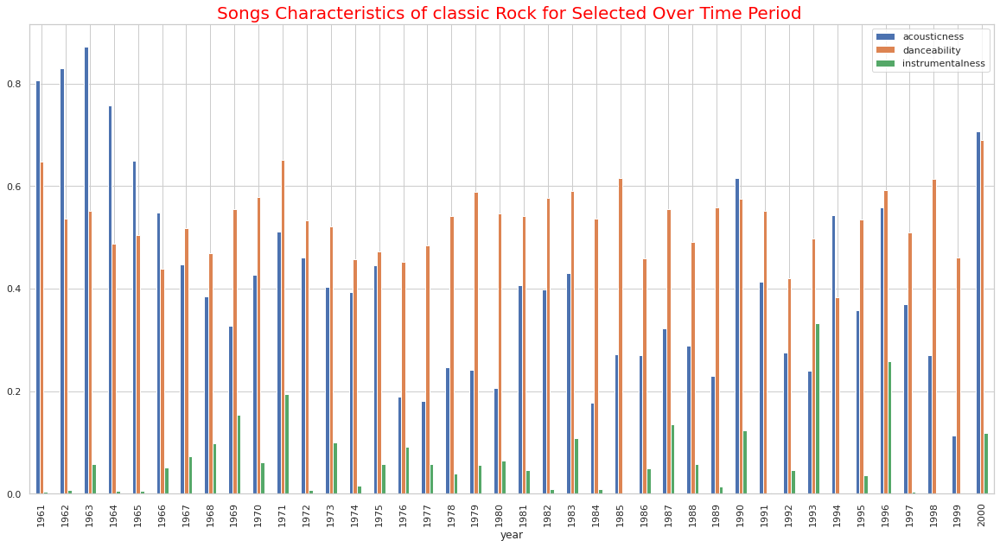

In [ ]:
plt.figure(1,figsize=(40,20))
label=cl_rock['year']
y=cl_rock['acousticness'],cl_rock['danceability'],cl_rock['instrumentalness']
ax = cl_rock.plot.bar(x='year', y=['acousticness','danceability','instrumentalness'], figsize=(20,10))
ax.set_title('Songs Characteristics of classic Rock for Selected Over Time Period ',fontsize=20,color='red')


When we look at the graphic in this section, we see the changes of classic rock, a sub-genre of rock, such as acousticness, danceability and instrumentalness over the years. While the acousticness was high in the first years, it has declined over the years. Danceability has generally been at steady levels but has occasionally seen small increases. Finally, instrumentalness started to be preferred in the following years, although it could not be used at all in the first years.


Text(0.5, 1.0, 'Songs Characteristics of Album Rock for Selected Over Time Period ')

<Figure size 1440x720 with 0 Axes>

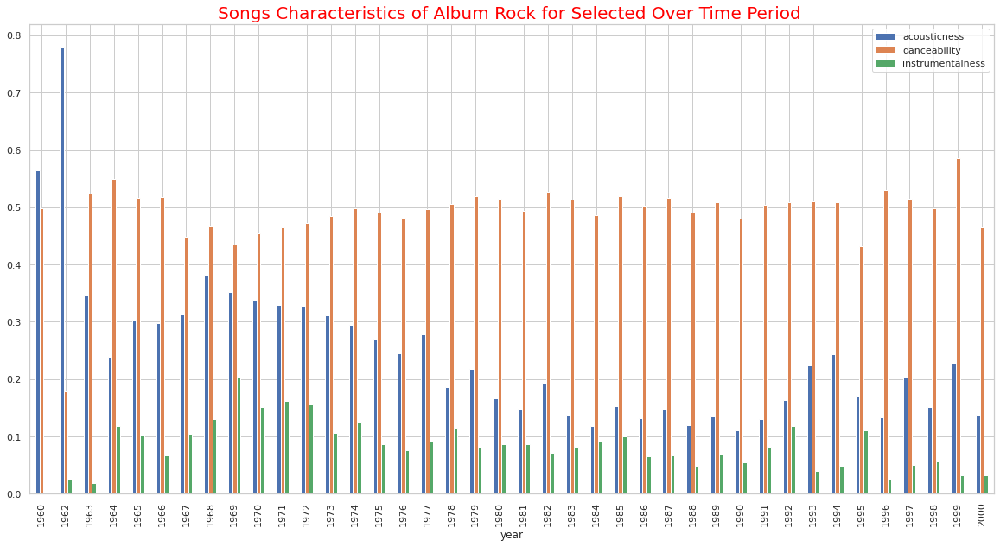

In [ ]:
plt.figure(1,figsize=(20,10))
label=alb_rock['year']
y=alb_rock['acousticness'],alb_rock['danceability'],alb_rock['instrumentalness']
ax = alb_rock.plot.bar(x='year', y=['acousticness','danceability','instrumentalness'], figsize=(20,10))
ax.set_title('Songs Characteristics of Album Rock for Selected Over Time Period ',fontsize=20,color='red')

In this part, album rock, which is a sub-genre of another rock, has been examined. Danceability seems to be at the same level in every period. In the Instrumentalness part, we see that it always remains at low levels. While the acousticness feature was preferred more in the early days, there was a decrease in its use for the following periods.



In [ ]:
justRap = dataOfRap.drop(columns=['release_date','artists','id','key','mode','name','popularity','explicit'])
justRap=justRap[justRap['year']>=1980]
justRap=justRap[justRap['year']<=2020]
justRap.tail()

,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,year,genres
119873,0.0318,0.758,194347,0.666,0.004180,0.289,-8.088,0.1400,162.083,0.701,2020,pop rap
170020,0.1950,0.762,110498,0.542,0.000000,0.125,-6.251,0.3500,159.954,0.201,2020,florida rap
119920,0.1360,0.460,192413,0.622,0.000029,0.130,-6.884,0.1120,124.672,0.294,2020,baton rouge rap
120036,0.0190,0.509,78681,0.542,0.006390,0.230,-8.027,0.4420,97.767,0.151,2020,emo rap
120528,0.2750,0.802,211654,0.737,0.000000,0.113,-4.862,0.0757,127.013,0.712,2020,melodic rap


In [ ]:
justRap=justRap.groupby(['year', 'genres']).agg({'danceability':'mean','acousticness':'mean','energy':'mean','instrumentalness':'mean','speechiness':'mean','loudness':'mean','tempo':'mean','duration_ms':'mean'})
justRap = justRap.reset_index()
justRap['genres'].value_counts()[:25]

cali rap           30
gangster rap       29
dirty south rap    28
chicago rap        25
chicano rap        22
country rap        20
dark trap          19
melodic rap        19
emo rap            19
baton rouge rap    17
pop rap            16
alabama rap        11
bass trap          10
nyc rap             9
rap                 9
meme rap            9
battle rap          8
dmv rap             7
dfw rap             7
florida rap         7
dirty texas rap     6
rap rock            6
comedy rap          6
k-rap               6
viral rap           5
Name: genres, dtype: int64

###Extracting the two of the subgenres of rap parent genre to examine them temporal changes of the features among 1980-2000:

In [ ]:
gangsta_rap=justRap[justRap['genres']=='gangster rap']
cali_rap=justRap[justRap['genres']=='cali rap']

Text(0.5, 1.0, 'Songs Characteristics of gangster rap for Selected Over Time Period ')

<Figure size 2880x1440 with 0 Axes>

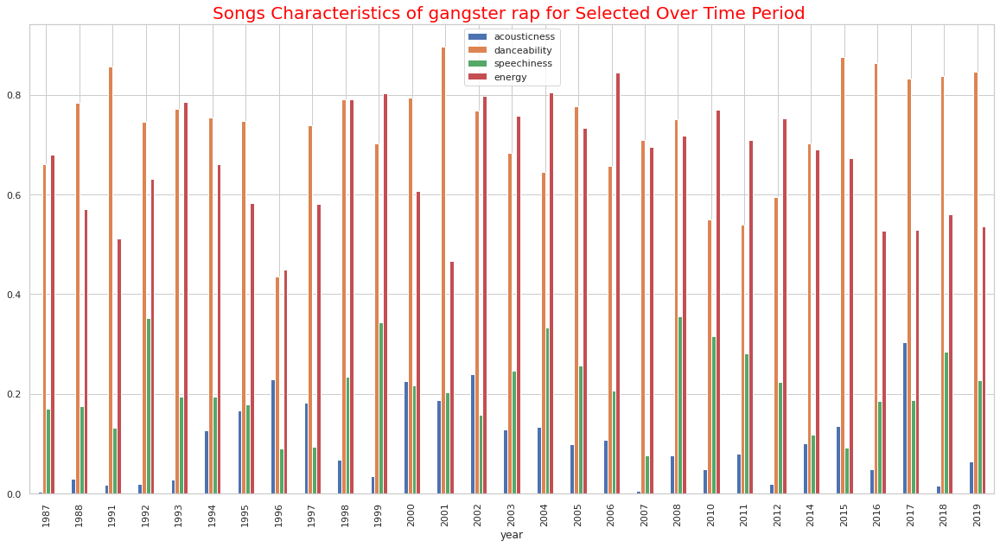

In [ ]:
plt.figure(1,figsize=(40,20))
label=gangsta_rap['year']
y=gangsta_rap['acousticness'],gangsta_rap['danceability'],gangsta_rap['speechiness'],gangsta_rap['energy']
ax = gangsta_rap.plot.bar(x='year', y=['acousticness','danceability','speechiness','energy'], figsize=(20,10))
ax.set_title('Songs Characteristics of gangster rap for Selected Over Time Period ',fontsize=20,color='red')

When we look at the graph in this section, we see the changes of ganster rap, a subgenre of rap, over the years, such as acousticness, danceability speechiness, and energy. We see that features such as enery and danceability are high in this genre, which was an expected feature for this genre. It seems that the acousticness feature is not preferred much. It seems that the speechiness feature has been stable over the years.


Text(0.5, 1.0, 'Songs Characteristics of cali rap for Selected Over Time Period ')

<Figure size 2880x1440 with 0 Axes>

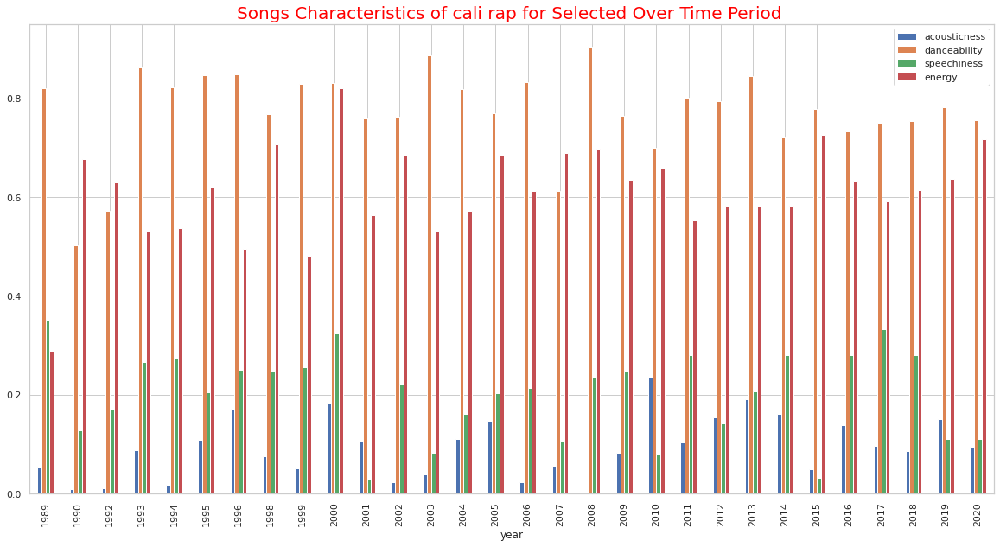

In [ ]:
plt.figure(1,figsize=(40,20))
label=cali_rap['year']
y=cali_rap['acousticness'],cali_rap['danceability'],cali_rap['speechiness'],cali_rap['energy']
ax = cali_rap.plot.bar(x='year', y=['acousticness','danceability','speechiness','energy'], figsize=(20,10))
ax.set_title('Songs Characteristics of cali rap for Selected Over Time Period ',fontsize=20,color='red')

When looking at the cali rap feature, it seems that the energy and danceability feature is at the top levels in the same way as the rap type and other rap types above. It appears to be at low levels of acousticness again and less preferred for rap. Speechiness, like the other rap genre above, can be seen at medium levels and has not changed much over the years.


# Our Future Goal

In the next parts we will try to find correlations with the popularity index according to features.this will be our first step.Our second goal is that according to the changing fashion of certain periods. We will be trying to find how the types of music changed in those periods. Our last goal is that the try to find statistical differences in sub-genres of one parent genres.